# Imports

In [1]:
import numpy as np
import os

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import pandas as pd

from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# General functions

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

# # Customize the axes and gridlines
# sns.set_style("whitegrid", {
#     'axes.edgecolor': '0',
#     'axes.linewidth': 1.25,
#     'grid.color': '.8',
#     'grid.linestyle': '--'
# })

# =========================================

# import matplotlib.pyplot as plt
# import seaborn as sns

# # Set general plot style similar to your provided image
# plt.style.use('default')  # Start with the default style for a clean look

# # Custom settings to match the style in your plot
# plt.rc('axes', labelsize=14)  # Increase axis label font size
# plt.rc('xtick', labelsize=12)  # Increase x-tick label font size
# plt.rc('ytick', labelsize=12)  # Increase y-tick label font size
# plt.rc('legend', fontsize=12)  # Adjust legend font size
# plt.rc('lines', linewidth=2)  # Thicker lines for readability
# plt.rc('axes', edgecolor='black', linewidth=10)  # Black axes edges with a bit thicker line

# # Set seaborn style
# sns.set(style='whitegrid', palette='colorblind')  # Minimal grid, colorblind-friendly palette

# ==============================================

# import matplotlib.pyplot as plt
# import pandas as pd
# import scienceplots

# from matplotlib import rc
# import matplotlib.pylab as plt
# import seaborn as sns


# plt.style.use('science')

# rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
# rc('text', usetex=False)
# sns.set(style='whitegrid', palette='tab10')

# ==============================================

# import matplotlib.pyplot as plt
# import matplotlib as mpl

# from matplotlib import rc

# rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
# rc('text', usetex=True)

# mpl.rcParams['text.usetex'] = True
# mpl.rcParams['font.family'] = 'serif'
# mpl.rcParams['font.serif'] = ['Computer Modern']

# mpl.rcParams['font.size'] = 12

# mpl.rcParams['figure.figsize'] = (10, 6)  
# mpl.rcParams['axes.titlesize'] = 14   
# mpl.rcParams['axes.labelsize'] = 12    
# mpl.rcParams['xtick.labelsize'] = 10   
# mpl.rcParams['ytick.labelsize'] = 10     
# mpl.rcParams['legend.fontsize'] = 10  
# mpl.rcParams['lines.linewidth'] = 1.5 
# mpl.rcParams['lines.markersize'] = 6     

# try:
#     import seaborn as sns
#     sns.set(style='whitegrid')
# except ImportError:
#     pass

# =================================================

import matplotlib.pyplot as plt

# Customize the axes and gridlines
sns.set_style("whitegrid", {
    'axes.edgecolor': '0',
    'axes.linewidth': 1.25,
    'grid.color': '.8',
    'grid.linestyle': '--'
})


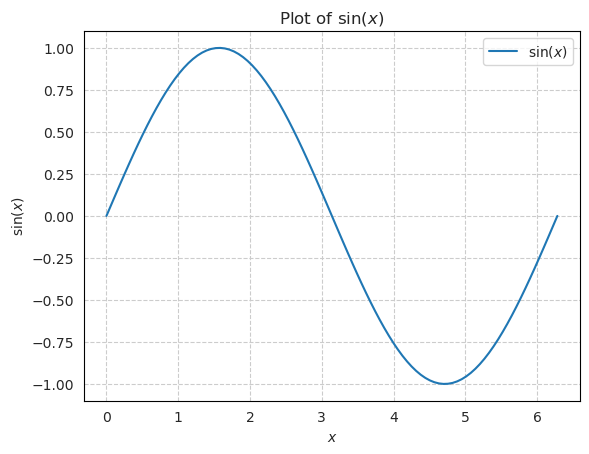

In [3]:
import numpy as np

x = np.linspace(0, 2 * np.pi, 100)
y = np.sin(x)

plt.plot(x, y, label=r'$\sin(x)$')
plt.title(r'Plot of $\sin(x)$')
plt.xlabel(r'$x$')
plt.ylabel(r'$\sin(x)$')
plt.legend()
plt.grid(True)
plt.show()

In [4]:

import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd

def plot_fad_scores_w_vae(df, dataset_name, reference_dataset_name, fad_model_name, plot_vae=False):
    filtered_df = df[(df['dataset'] == dataset_name) & 
                     (df['reference_dataset'] == reference_dataset_name) &
                     (df['fad_model'] == fad_model_name)]
    if filtered_df.empty:
        return
    
    resolutions = filtered_df['resolution'].unique()
    
    colors_non_vae = plt.cm.tab10(range(len(resolutions)))
    colors_vae = plt.cm.get_cmap('Pastel1')(np.arange(len(resolutions)))
    
    plt.figure(figsize=(6,4))
    
    for color, resolution in zip(colors_non_vae, resolutions):
        resolution_df = filtered_df[(filtered_df['resolution'] == resolution) &
                                    (filtered_df['vae'].isna())]
        
        resolution_df = resolution_df.sort_values(by='model_step')

        for sampler in resolution_df['sampler'].unique():
            sampler_df = resolution_df[resolution_df['sampler'] == sampler]
            line_style = '--' if sampler == 'ddim' else '-'
            marker = '+' if sampler == 'ddim' else 'o'
            markersize = 8 if sampler == 'ddim' else 4

            plt.plot(sampler_df['model_step'], sampler_df['value'], marker, markersize=markersize, label=f'{resolution} ({sampler})', linestyle=line_style, color=color)
    
    if plot_vae:
        vae_filtered_df = filtered_df[filtered_df['vae'].notna()]
        if not vae_filtered_df.empty:
            for color, resolution in zip(colors_vae, resolutions):
                resolution_vae_df = vae_filtered_df[(vae_filtered_df['resolution'] == resolution) &
                                                    (vae_filtered_df['vae'].notna())]
                
                for sampler in resolution_vae_df['sampler'].unique():
                    sampler_vae_df = resolution_vae_df[resolution_vae_df['sampler'] == sampler]
                    line_style = ':' if sampler == 'ddim' else '-.'
                    marker = 'x' if sampler == 'ddim' else 's'
                    markersize = 6 if sampler == 'ddim' else 5
                    
                    plt.plot(sampler_vae_df['model_step'], sampler_vae_df['value'], marker, markersize=markersize, label=f'{resolution} ({sampler} VAE)', linestyle=line_style, color=color)
    
    plt.title(f'Trained on {dataset_name}, Evaluated on {reference_dataset_name}')
    plt.xlabel('Model Step')
    plt.ylabel(f'FAD: {fad_model_name}')
    plt.xlim(0, 40000)
    plt.ylim(filtered_df['value'].min(), filtered_df['value'].max())
    
    plt.legend(title='Resolution (Sampler)')
    
    output_dir = '../results/plots/'
    suffix = '_w_vae' if plot_vae else ''
    os.makedirs(output_dir, exist_ok=True)
    file_name = f"fad_{dataset_name}_{reference_dataset_name}_{fad_model_name}{suffix}.png"
    plt.savefig(os.path.join(output_dir, file_name), dpi=300)
    
    plt.show()

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

def plot_fad_samples(df, dataset_name):
    reference_sets = df['reference_dataset'].unique()
    fad_models = df['fad_model'].unique()

    line_styles = {'ddim': '--', 'ddpm': '-'}
    markers = {'ddim': '+', 'ddpm': 'o'}
    markersizes = {'ddim': 8, 'ddpm': 4}

    colormap = cm.get_cmap('tab10', len(df['resolution'].unique()))

    fig, axs = plt.subplots(3, 3, figsize=(18, 18))

    for i, reference_set in enumerate(reference_sets):
        for j, fad_model in enumerate(fad_models):
            ax = axs[i, j]
            filtered_df = df[(df['dataset'] == dataset_name) & 
                             (df['reference_dataset'] == reference_set) & 
                             (df['fad_model'] == fad_model)]
            filtered_df = filtered_df.sort_values(by='num_fad_samples')

            resolutions = filtered_df['resolution'].unique()
            samplers = filtered_df['sampler'].unique()
            resolution_colors = {resolution: colormap(k) for k, resolution in enumerate(resolutions)}

            for resolution in resolutions:
                for sampler in samplers:
                    sub_df = filtered_df[(filtered_df['resolution'] == resolution) & 
                                         (filtered_df['sampler'] == sampler)]
                    if not sub_df.empty:
                        line_style = line_styles.get(sampler, '-')
                        marker = markers.get(sampler, 'o')
                        markersize = markersizes.get(sampler, 4)
                        color = resolution_colors[resolution]
                        
                        ax.plot(sub_df['num_fad_samples'], sub_df['value'], 
                                linestyle=line_style, marker=marker, markersize=markersize, 
                                color=color, label=f'Resolution {resolution}, Sampler {sampler}')

            ax.set_xlabel('Number of FAD Samples')
            ax.set_ylabel('Value')
            ax.set_title(f'{reference_set}, {fad_model}')
            ax.legend()
            ax.grid(True)

    plt.tight_layout()
    plt.savefig(f"../results/plots/FAD_Samples_Grid_{dataset_name}.png", dpi=300)
    plt.show()

In [6]:
def extract_scalars(log_dir):
    event_acc = EventAccumulator(log_dir)
    event_acc.Reload()
    tags = event_acc.Tags()['scalars']
    data = {tag: [] for tag in tags}
    
    for tag in tags:
        scalar_events = event_acc.Scalars(tag)
        for event in scalar_events:
            data[tag].append({
                'wall_time': event.wall_time,
                'step': event.step,
                'value': event.value
            })
    return data

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_bar_graph(df, dataset, fad_model):
    filtered_df = df[(df['dataset'] == dataset) & (df['fad_model'] == fad_model)]
    
    pivot_df = filtered_df.pivot_table(values='value', 
                                       index='reference_dataset', 
                                       columns='resolution', 
                                       aggfunc='mean').fillna(0)
    
    ax = plt.gca()
    pivot_df.plot(kind='bar', stacked=True, figsize=(12, 8), alpha=0.6, ax=ax)
    
    plt.title(f'Overlay Bar Graph for dataset={dataset} and fad_model={fad_model}')
    plt.xlabel('Reference Dataset')
    plt.ylabel('Value')
    plt.legend(title='Resolution', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

def plot_filtered_data(df, dataset, fad_model):
    filtered_df = df[(df['dataset'] == dataset) & (df['fad_model'] == fad_model)]
    fig, ax = plt.subplots()

    unique_resolutions = filtered_df['resolution'].unique()
    colors = cm.rainbow(np.linspace(0, 1, len(unique_resolutions)))
    color_dict = dict(zip(unique_resolutions, colors))

    for index, row in filtered_df.iterrows():
        if row['sampler'] == 'ddpm':
            marker = 'o'
            facecolor = color_dict[row['resolution']]
            hatch = None
        else:
            marker = 'o'
            facecolor = 'none'
            hatch = '///'
        edgecolor = color_dict[row['resolution']]
        ax.scatter(row['inference_time'], row['value'], label=row['resolution'], edgecolors=edgecolor, facecolors=facecolor, s=150, marker=marker, hatch=hatch)

    ax.set_xlabel('inference_time')
    ax.set_ylabel('value')
    
    custom_markers = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=12, label='ddpm'),
        Patch(facecolor='none', edgecolor='gray', hatch='///', label='ddim')
    ]

    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    resolution_handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict[res], markersize=12, label=res) for res in by_label.keys()]
    combined_handles = custom_markers + resolution_handles
    combined_labels = ['ddpm', 'ddim', ''] + list(by_label.keys())

    ax.legend(combined_handles, combined_labels, title='Legend', loc='upper right')

    ax.axvline(x=1, color='gray', linestyle='--')
    ax.text(1.05, ax.get_ylim()[1] * 0.95, 'real-time inference threshold', color='gray', rotation=90, verticalalignment='top')

    plt.show()

### Loading Dataset for Testing/Viewing

In [9]:
from datasets import load_dataset, load_from_disk

# dataset_path = "/home/th716/audio-diffusion/cache/spotify_sleep_dataset/final_datasets/mel_spec_512_128_hl256_nfft512_sleep_only/train"
dataset_path = "/home/th716/audio-diffusion/cache/spotify_sleep_dataset/final_datasets/bigvgan_2048_128_sleep_only/train"
data = load_from_disk(dataset_path)

/home/th716/.conda/envs/audiodiff_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
data[0]

{'mel': [[[-2.795584201812744,
    -3.5548017024993896,
    -3.476979970932007,
    -3.0864787101745605,
    -3.4102089405059814,
    -4.316312313079834,
    -3.7104270458221436,
    -3.927222967147827,
    -3.64455246925354,
    -4.0762715339660645,
    -4.169663429260254,
    -4.361663341522217,
    -4.727686882019043,
    -4.734959125518799,
    -3.800872802734375,
    -4.107059478759766,
    -4.811788082122803,
    -4.238827705383301,
    -4.192685127258301,
    -4.125615119934082,
    -4.896613597869873,
    -4.101016998291016,
    -4.357818603515625,
    -4.145212173461914,
    -4.217835426330566,
    -4.3197174072265625,
    -3.7983739376068115,
    -4.41373348236084,
    -6.019490718841553,
    -4.136688709259033,
    -3.8521533012390137,
    -5.620052337646484,
    -4.449419021606445,
    -5.049598217010498,
    -5.090339660644531,
    -4.815463542938232,
    -5.215449810028076,
    -4.019326686859131,
    -4.115927696228027,
    -4.777077674865723,
    -4.528118133544922,
   

In [11]:
import torch
tnsr = torch.tensor(data[0]["mel"])

# check earlier models for inference

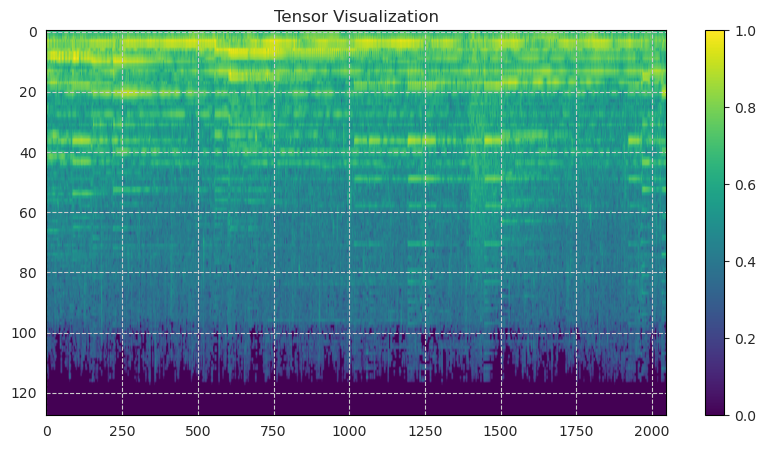

In [12]:
import torch
import matplotlib.pyplot as plt

# Remove the singleton dimension
tensor_squeezed = tnsr.squeeze(0)  # Now shape is [128, 2048]

# Normalize to range [0, 1] for visualization
tensor_normalized = (tensor_squeezed - tensor_squeezed.min()) / (tensor_squeezed.max() - tensor_squeezed.min())

# Convert to NumPy
image = tensor_normalized.numpy()

# Display the image
plt.figure(figsize=(10, 5))
plt.imshow(image, cmap='viridis', aspect='auto')  # Choose colormap and adjust aspect ratio
plt.colorbar()  # Add a colorbar for reference
plt.title("Tensor Visualization")
plt.show()


In [17]:
from diffusers.pipelines.audio_diffusion import Mel
from IPython.display import display, Audio
import numpy as np

resolution = data[0]["image"].size

mel = Mel(
    x_res=resolution[0],
    y_res=resolution[1],
    hop_length=512,
    sample_rate=22050,
    n_fft=2048,
    n_iter=32
)

mel_data = data[0]

audio = mel.image_to_audio(mel_data["image"])


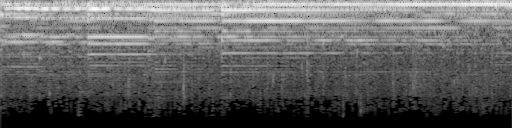

In [30]:
display(mel_data["image"])
display(Audio(audio, rate=22050))

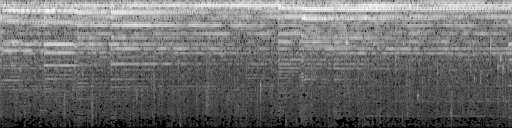

In [20]:
display(mel_data["image"])
display(Audio(audio, rate=22050))

### New HL and NFFT attempts!


In [121]:
import matplotlib.pyplot as plt

# Customize the axes and gridlines
sns.set_style("whitegrid", {
    'axes.edgecolor': '0',
    'axes.linewidth': 1.25,
    'grid.color': '.8',
    'grid.linestyle': '--'
})

In [143]:
log_dirs = [
    "../hpc_tensorboard/final_models/final_ssd_512_128_hl256_nfft512_so/model_step_200000/samples/sch_ddpm_nisteps_1000/gl32/logs",
    "../hpc_tensorboard/final_models/final_ssd_512_128_hl512_nfft1024_so/model_step_200000/samples/sch_ddpm_nisteps_1000/gl32/logs",
    "../hpc_tensorboard/final_models/final_ssd_512_128_so/model_step_200000/samples/gl32/logs",
]

In [150]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('../results/new_hl_and_nfft.csv', index=False)


In [151]:
result_df = pd.read_csv('../results/new_hl_and_nfft.csv')

In [152]:
result_df['log_dir'][0]

'../hpc_tensorboard/final_models/final_ssd_512_128_hl256_nfft512_so/model_step_200000/samples/sch_ddpm_nisteps_1000/gl32/logs'

In [153]:
result_df['tag'][0]

'fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_None'

In [154]:
def extract_hl(log_dir):
    try:
        hl = log_dir.split('/')[3].split('_')[4]
        if hl == 'so': return 256
        else: return hl
    except IndexError:
        return '256'

def extract_nfft(log_dir):
    try: return log_dir.split('/')[3].split('_')[5]
    except IndexError: return '1024'

result_df['hop_length'] = result_df['log_dir'].apply(extract_hl)
result_df['resolution'] = [(512, 128)] * len(result_df)
result_df['n_fft'] = result_df['log_dir'].apply(extract_nfft)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

result_df['hop_length'] = result_df['hop_length'].astype(str).str.extract('(\d+)')
result_df['n_fft'] = result_df['n_fft'].astype(str).str.extract('(\d+)')

In [155]:
result_df

,wall_time,step,value,hop_length,resolution,n_fft,fad_model,reference_dataset
0,1.740923e+09,0,0.471430,256,"(512, 128)",512,clap-laion-audio,spotify_sleep_dataset
1,1.740928e+09,0,0.471430,256,"(512, 128)",512,clap-laion-audio,spotify_sleep_dataset
2,1.740923e+09,0,0.410934,256,"(512, 128)",512,clap-laion-music,spotify_sleep_dataset
3,1.740929e+09,0,0.410934,256,"(512, 128)",512,clap-laion-music,spotify_sleep_dataset
4,1.740929e+09,0,5.514567,256,"(512, 128)",512,vggish,spotify_sleep_dataset
5,1.740929e+09,0,0.818815,256,"(512, 128)",512,clap-laion-audio,fma_pop
6,1.740929e+09,0,0.875499,256,"(512, 128)",512,clap-laion-music,fma_pop
7,1.740929e+09,0,14.590899,256,"(512, 128)",512,vggish,fma_pop
8,1.740929e+09,0,0.795245,256,"(512, 128)",512,clap-laion-audio,musiccaps
9,1.740929e+09,0,0.872580,256,"(512, 128)",512,clap-laion-music,musiccaps


In [156]:
result_df.to_csv('../results/cleaned_new_hl_nfft_runs.csv', index=False)

In [157]:
result_df[result_df['reference_dataset'] == 'fma_pop']


,wall_time,step,value,hop_length,resolution,n_fft,fad_model,reference_dataset
5,1.740929e+09,0,0.818815,256,"(512, 128)",512,clap-laion-audio,fma_pop
6,1.740929e+09,0,0.875499,256,"(512, 128)",512,clap-laion-music,fma_pop
7,1.740929e+09,0,14.590899,256,"(512, 128)",512,vggish,fma_pop
16,1.740929e+09,0,0.807278,512,"(512, 128)",1024,clap-laion-audio,fma_pop
17,1.740929e+09,0,0.878773,512,"(512, 128)",1024,clap-laion-music,fma_pop
18,1.740929e+09,0,15.550759,512,"(512, 128)",1024,vggish,fma_pop
25,1.740664e+09,0,0.987687,256,"(512, 128)",1024,clap-laion-audio,fma_pop
26,1.740664e+09,0,1.012392,256,"(512, 128)",1024,clap-laion-music,fma_pop
27,1.740664e+09,0,14.865512,256,"(512, 128)",1024,vggish,fma_pop


### Load mel-spectrogram variable experiments (HL and NFFT)


In [40]:
import matplotlib.pyplot as plt

# Customize the axes and gridlines
sns.set_style("whitegrid", {
    'axes.edgecolor': '0',
    'axes.linewidth': 1.25,
    'grid.color': '.8',
    'grid.linestyle': '--'
})

In [35]:
hpc_tensorboard_path = "../hpc_tensorboard/waveform_1024/"
log_dirs = [os.path.join(hpc_tensorboard_path, d) for d in os.listdir(hpc_tensorboard_path) if os.path.isdir(os.path.join(hpc_tensorboard_path, d))]
log_dirs = [os.path.join(d, "converted_gl32", "logs") for d in log_dirs]

FileNotFoundError: [Errno 2] No such file or directory: '../hpc_tensorboard/waveform_1024/'

In [19]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('../results/scalars_mel_spec_vars.csv', index=False)


2025-03-02 16:04:12.523913: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-02 16:04:12.564444: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-02 16:04:14.606718: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [36]:
result_df = pd.read_csv('../results/scalars_mel_spec_vars.csv')

In [37]:
result_df['log_dir'][0]

'../hpc_tensorboard/waveform_1024/mel_spec_512_128_hl_128_nfft_4096/converted_gl32/logs'

In [38]:
result_df['tag'][0]

'fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_spotify_sleep_dataset'

In [39]:
def extract_hl(log_dir):
    return log_dir.split('/')[3].split('_')[5]

def extract_nfft(log_dir):
    return log_dir.split('/')[3].split('_')[7]

result_df['hop_length'] = result_df['log_dir'].apply(extract_hl)
result_df['resolution'] = [(512, 128)] * len(result_df)
result_df['n_fft'] = result_df['log_dir'].apply(extract_nfft)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_fad_heatmap(df, fad_model, reference_dataset, output_path="../results/plots/fad_heatmap.pdf"):
    """
    Generates a heatmap from the given dataframe.
    
    Parameters:
    df (pd.DataFrame): Dataframe containing the relevant columns.
    fad_model (str): The FAD model to filter the dataframe.
    reference_dataset (str): The reference dataset to filter the dataframe.
    
    The heatmap:
    - x-axis: 'hop_length' values (sorted)
    - y-axis: 'n_fft' values (sorted)
    - Heatmap values: 'value' column
    """
    # Filter dataframe
    df['n_fft'] = pd.to_numeric(df['n_fft'], errors='coerce')
    df['hop_length'] = pd.to_numeric(df['hop_length'], errors='coerce')

    filtered_df = df[(df['fad_model'] == fad_model) & (df['reference_dataset'] == reference_dataset)]
    filtered_df = filtered_df.sort_values(by=['n_fft', 'hop_length'])
    
    # Pivot table for heatmap with sorting
    heatmap_data = filtered_df.pivot_table(index='n_fft', columns='hop_length', values='value', aggfunc='mean')

    # Ensure sorted index and columns
    heatmap_data = heatmap_data.sort_index().sort_index(axis=1)
    
    # Plot heatmap
    cmap = "viridis_r"
    cmap = "copper_r"
    plt.figure(figsize=(5,4))
    sns.heatmap(heatmap_data, annot=True, cmap=cmap, fmt=".2f", linewidths=0.5, cbar=False)
    plt.xlabel('Hop Length')
    plt.ylabel('N FFT')
    plt.title(f'FAD scores, {fad_model}, {reference_dataset}')

    # Save to PDF
    plt.savefig(output_path, format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

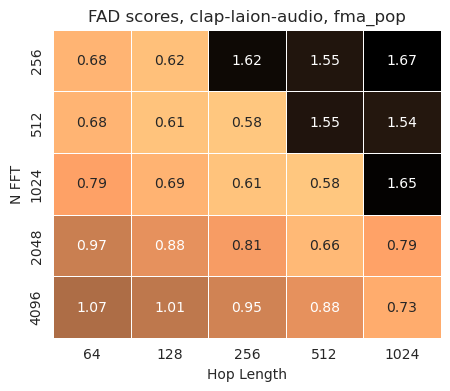

In [62]:
plot_fad_heatmap(result_df, 'clap-laion-audio', 'fma_pop', "../results/plots/heatmap_fad_cla_fmapop.pdf")

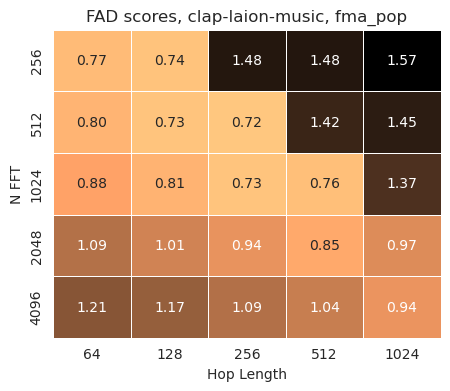

In [63]:
plot_fad_heatmap(result_df, 'clap-laion-music', 'fma_pop', "../results/plots/heatmap_fad_clm_fmapop.pdf")


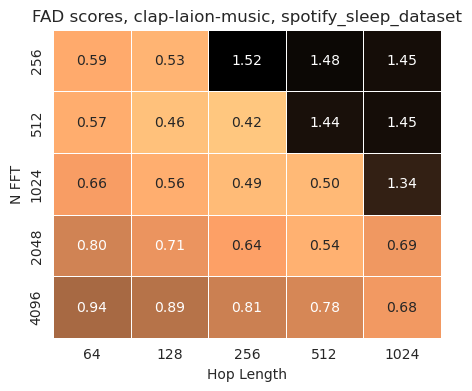

In [64]:
plot_fad_heatmap(result_df, 'clap-laion-music', 'spotify_sleep_dataset', "../results/plots/heatmap_fad_clm_ssd.pdf")


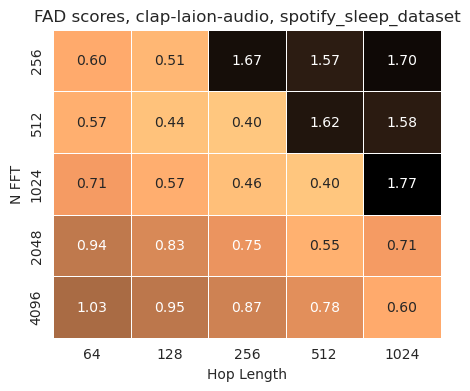

In [65]:
plot_fad_heatmap(result_df, 'clap-laion-audio', 'spotify_sleep_dataset', "../results/plots/heatmap_fad_cla_ssd.pdf")


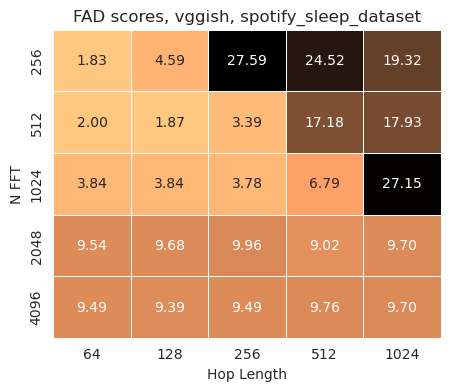

In [66]:
plot_fad_heatmap(result_df, 'vggish', 'spotify_sleep_dataset', "../results/plots/heatmap_fad_vgg_ssd.pdf")


### Load Final Model Runs, for final table!

In [19]:
import os

hpc_tensorboard_path = "../hpc_tensorboard/final_models/"
log_dirs = []

for root, dirs, files in os.walk(hpc_tensorboard_path):
    if 'samples' in dirs:
        samples_path = os.path.join(root, 'samples')
        for sub_root, sub_dirs, sub_files in os.walk(samples_path):
            if 'logs' in sub_dirs:
                logs_path = os.path.join(sub_root, 'logs')
                log_dirs.append(logs_path)

print(log_dirs)


['../hpc_tensorboard/final_models/final_ssd_512_128_hl512_nfft1024_so/model_step_200000/samples/sch_ddpm_nisteps_1000/gl32/logs', '../hpc_tensorboard/final_models/final_ssd_2048_128_so_bigvgan/model_step_130000/samples/bigvgan/audio/logs', '../hpc_tensorboard/final_models/final_ssd_2048_128_so/model_step_145000/samples/gl32/logs', '../hpc_tensorboard/final_models/final_ssd_512_128_hl256_nfft512_so/model_step_200000/samples/sch_ddpm_nisteps_1000/gl32/logs', '../hpc_tensorboard/final_models/unet_w_vae_final_ssd_512_128_to_128_32_so_bigvgan/model_step_400000/samples/audio/sch_ddpm_nisteps_1000/bigvgan/audio/logs', '../hpc_tensorboard/final_models/final_ssd_512_128_so_bigvgan/model_step_195000/samples/bigvgan/audio/logs', '../hpc_tensorboard/final_models/unet_w_vae_final_ssd_512_128_to_128_32_so/model_step_400000/samples/audio/sch_ddpm_nisteps_1000/gl32/logs', '../hpc_tensorboard/final_models/unet_w_vae_final_ssd_2048_128_to_512_32_so/model_step_465000/samples/audio/sch_ddpm_nisteps_1000/g

In [46]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('../results/final_models_scalars.csv', index=False)

In [47]:
result_df['log_dir'][40]

'../hpc_tensorboard/final_models/unet_w_vae_final_ssd_512_128_to_128_32_so_bigvgan/model_step_400000/samples/audio/sch_ddpm_nisteps_1000/bigvgan/audio/logs'

In [35]:
result_df['tag'][0]

'fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_None'

In [48]:
def extract_name(log_dir):
    return log_dir.split('/')[3]

def extract_resolution(log_dir):
    value = log_dir.split('/')[3].split('_')
    return value[2:4] if 'unet_w_vae' not in log_dir else value[5:7]

def extract_model_step(log_dir):
    value = log_dir.split('/')[4].split('_')[-1]
    return value

def extract_type(log_dir):
    return 'bigvgan' if 'bigvgan' in log_dir else 'image'

result_df['name'] = result_df['log_dir'].apply(extract_name)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['mel_spec_type'] = result_df['log_dir'].apply(extract_type)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

In [49]:
result_df.head()

,wall_time,step,value,name,resolution,model_step,mel_spec_type,fad_model,reference_dataset
0,1.740923e+09,0,0.483505,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-audio,spotify_sleep_dataset
1,1.740928e+09,0,0.483505,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-audio,spotify_sleep_dataset
2,1.740923e+09,0,0.505950,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-music,spotify_sleep_dataset
3,1.740929e+09,0,0.505950,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-music,spotify_sleep_dataset
4,1.740929e+09,0,7.527498,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,vggish,spotify_sleep_dataset


In [50]:
result_df.to_csv('../results/final_models_results.csv', index=False)

In [55]:
def get_filtered_df(ref_ds, fad_model):
    tmp = result_df[(result_df['reference_dataset'] == ref_ds) & (result_df['fad_model'] == fad_model)]
    display(tmp)

In [72]:
get_filtered_df('fma_pop', 'clap-laion-audio')

,wall_time,step,value,name,resolution,model_step,mel_spec_type,fad_model,reference_dataset
5,1.740929e+09,0,0.807278,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-audio,fma_pop
14,1.740683e+09,0,0.606723,final_ssd_2048_128_so_bigvgan,"[2048, 128]",130000,bigvgan,clap-laion-audio,fma_pop
23,1.740668e+09,0,0.823821,final_ssd_2048_128_so,"[2048, 128]",145000,image,clap-laion-audio,fma_pop
34,1.740929e+09,0,0.818815,final_ssd_512_128_hl256_nfft512_so,"[512, 128]",200000,image,clap-laion-audio,fma_pop
43,1.741450e+09,0,0.831753,unet_w_vae_final_ssd_512_128_to_128_32_so_bigvgan,"[512, 128]",400000,bigvgan,clap-laion-audio,fma_pop
52,1.740683e+09,0,0.806368,final_ssd_512_128_so_bigvgan,"[512, 128]",195000,bigvgan,clap-laion-audio,fma_pop
61,1.741450e+09,0,1.119246,unet_w_vae_final_ssd_512_128_to_128_32_so,"[512, 128]",400000,image,clap-laion-audio,fma_pop
70,1.741450e+09,0,1.153619,unet_w_vae_final_ssd_2048_128_to_512_32_so,"[2048, 128]",465000,image,clap-laion-audio,fma_pop
79,1.740664e+09,0,0.987687,final_ssd_512_128_so,"[512, 128]",200000,image,clap-laion-audio,fma_pop
88,1.741699e+09,0,1.566368,unet_w_vae_final_ssd_2048_128_to_512_32_so_big...,"[2048, 128]",315000,bigvgan,clap-laion-audio,fma_pop


In [65]:
get_filtered_df('fma_pop', 'clap-laion-music')

,wall_time,step,value,name,resolution,model_step,mel_spec_type,fad_model,reference_dataset
6,1.740929e+09,0,0.878773,final_ssd_512_128_hl512_nfft1024_so,"[512, 128]",200000,image,clap-laion-music,fma_pop
15,1.740683e+09,0,0.629904,final_ssd_2048_128_so_bigvgan,"[2048, 128]",130000,bigvgan,clap-laion-music,fma_pop
24,1.740668e+09,0,0.917004,final_ssd_2048_128_so,"[2048, 128]",145000,image,clap-laion-music,fma_pop
35,1.740929e+09,0,0.875499,final_ssd_512_128_hl256_nfft512_so,"[512, 128]",200000,image,clap-laion-music,fma_pop
44,1.741450e+09,0,0.821151,unet_w_vae_final_ssd_512_128_to_128_32_so_bigvgan,"[512, 128]",400000,bigvgan,clap-laion-music,fma_pop
53,1.740683e+09,0,0.806783,final_ssd_512_128_so_bigvgan,"[512, 128]",195000,bigvgan,clap-laion-music,fma_pop
62,1.741450e+09,0,1.128674,unet_w_vae_final_ssd_512_128_to_128_32_so,"[512, 128]",400000,image,clap-laion-music,fma_pop
71,1.741450e+09,0,1.190110,unet_w_vae_final_ssd_2048_128_to_512_32_so,"[2048, 128]",465000,image,clap-laion-music,fma_pop
80,1.740664e+09,0,1.012392,final_ssd_512_128_so,"[512, 128]",200000,image,clap-laion-music,fma_pop
89,1.741699e+09,0,1.480342,unet_w_vae_final_ssd_2048_128_to_512_32_so_big...,"[2048, 128]",315000,bigvgan,clap-laion-music,fma_pop


In [ ]:
import pandas as pd

def generate_filtered_table(df, reference_dataset):
    """
    Generate a table with columns:
    - Combined name and gl_iters
    - Value for 'clap-laion-audio'
    - Value for 'clap-laion-music'
    - Value for 'vggish'
    
    Parameters:
    df (pd.DataFrame): The input DataFrame.
    reference_dataset (str): The dataset to filter on.
    
    Returns:
    pd.DataFrame: The transformed DataFrame, ordered by 22kHz first, then 44kHz, then bigvgan.
    """
    # Filter DataFrame based on reference_dataset
    df_filtered = df[df['reference_dataset'] == reference_dataset]
    
    # Pivot the table to have fad_model as columns
    pivot_df = df_filtered.pivot_table(
        index=['name', 'gl_iters'], 
        columns='fad_model', 
        values='value', 
        aggfunc='first'
    ).reset_index()
    
    # Rename columns to match the desired output
    pivot_df.columns.name = None  # Remove the automatic column name
    pivot_df = pivot_df.rename(columns={
        'clap-laion-audio': 'clap-laion-audio_value',
        'clap-laion-music': 'clap-laion-music_value',
        'vggish': 'vggish_value'
    })
    
    # Combine 'name' and 'gl_iters' into a single column
    pivot_df.insert(0, 'identifier', pivot_df['name'] + '_' + pivot_df['gl_iters'].astype(str))
    pivot_df = pivot_df.drop(columns=['name', 'gl_iters'])
    
    # Define custom sorting order
    def sorting_key(identifier):
        if '22khz' in identifier:
            order = 1
        elif 'bigvgan' in identifier:
            order = 3
        elif '44khz' in identifier:
            order = 2
        else:
            order = 4
        
        if 'gl16' in identifier:
            sub_order = 1
        elif 'gl32' in identifier:
            sub_order = 2
        elif 'gl64' in identifier:
            sub_order = 3
        elif 'gl128' in identifier:
            sub_order = 4
        elif 'base_24khz' in identifier:
            sub_order = 5
        elif '24khz' in identifier:
            sub_order = 6
        elif 'v2_44khz' in identifier:
            sub_order = 7
        else:
            sub_order = 8
        
        return (order, sub_order)
    
    # Sort the DataFrame by the custom order
    pivot_df = pivot_df.sort_values(by='identifier', key=lambda x: x.map(sorting_key))
    
    # Clean up identifier strings
    def clean_identifier(identifier):
        if 'bigvgan' in identifier:
            return identifier.replace('_NA', '')
        elif 'mel_spec' in identifier:
            parts = identifier.split('_')
            return f"{parts[2]}, {parts[3]}"
        return identifier
    
    pivot_df['identifier'] = pivot_df['identifier'].apply(clean_identifier)
    
    # clean
    pivot_df['clap-laion-audio_value'] = pivot_df['clap-laion-audio_value'].round(3)
    pivot_df['clap-laion-music_value'] = pivot_df['clap-laion-music_value'].round(3)
    pivot_df['vggish_value'] = pivot_df['vggish_value'].round(3)
    
    return pivot_df

### Load GL + vocoder back-conversion experiments


In [34]:
hpc_tensorboard_path = "../hpc_tensorboard/waveform_selection_1024/"
log_dirs = [os.path.join(hpc_tensorboard_path, d) for d in os.listdir(hpc_tensorboard_path) if os.path.isdir(os.path.join(hpc_tensorboard_path, d))]
log_dirs = [os.path.join(d, sub_dir, "logs") for d in log_dirs for sub_dir in os.listdir(d) if 'converted' in sub_dir and os.path.exists(os.path.join(d, sub_dir, "logs"))]

log_dirs

['../hpc_tensorboard/waveform_selection_1024/bigvgan_24khz_100band/converted_audio/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_44khz/converted_audio_gl128/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_44khz/converted_audio_gl64/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_44khz/converted_audio_gl32/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_44khz/converted_audio_gl16/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_22khz/converted_audio_gl128/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_22khz/converted_audio_gl32/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_22khz/converted_audio_gl64/logs',
 '../hpc_tensorboard/waveform_selection_1024/mel_spec_22khz/converted_audio_gl16/logs',
 '../hpc_tensorboard/waveform_selection_1024/bigvgan_v2_44khz_128band_256x/converted_audio/logs',
 '../hpc_tensorboard/waveform_selection_1024/bigvgan_base_24khz_100band/converted_audio/logs']

In [36]:
!ls ../hpc_tensorboard/waveform_selection_1024/bigvgan_base_24khz_100band/converted_audio/logs

events.out.tfevents.1740585422.gpu-q-31.47326.0
events.out.tfevents.1740585676.gpu-q-31.47326.1
events.out.tfevents.1740585714.gpu-q-31.47326.2
events.out.tfevents.1740585718.gpu-q-31.47326.3
events.out.tfevents.1740585723.gpu-q-31.47326.4
events.out.tfevents.1740585727.gpu-q-31.47326.5
events.out.tfevents.1740585731.gpu-q-31.47326.6
events.out.tfevents.1740585734.gpu-q-31.47326.7
events.out.tfevents.1740585738.gpu-q-31.47326.8


In [72]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('../results/scalars_gl_experiments.csv', index=False)

In [73]:
result_df['log_dir'][10]

'../hpc_tensorboard/waveform_selection_1024/mel_spec_44khz/converted_audio_gl128/logs'

In [74]:
result_df['tag'][0]

'fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_spotify_sleep_dataset'

In [75]:
def extract_name(log_dir):
    return log_dir.split('/')[3]

def extract_gl_iters(log_dir):
    value = log_dir.split('/')[4].split('_')[-1]
    return value if 'gl' in value else 'NA'

result_df['name'] = result_df['log_dir'].apply(extract_name)
result_df['gl_iters'] = result_df['log_dir'].apply(extract_gl_iters)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

In [67]:
result_df.head(20)

,wall_time,step,value,name,gl_iters,fad_model,reference_dataset
0,1.740416e+09,0,0.062856,bigvgan_24khz_100band,NA,clap-laion-audio,spotify_sleep_dataset
1,1.740416e+09,0,0.292140,bigvgan_24khz_100band,NA,clap-laion-music,spotify_sleep_dataset
2,1.740416e+09,0,0.292173,bigvgan_24khz_100band,NA,vggish,spotify_sleep_dataset
3,1.740416e+09,0,0.364379,bigvgan_24khz_100band,NA,clap-laion-audio,fma_pop
4,1.740416e+09,0,0.470755,bigvgan_24khz_100band,NA,clap-laion-music,fma_pop
5,1.740416e+09,0,6.158483,bigvgan_24khz_100band,NA,vggish,fma_pop
6,1.740416e+09,0,0.371115,bigvgan_24khz_100band,NA,clap-laion-audio,musiccaps
7,1.740416e+09,0,0.403361,bigvgan_24khz_100band,NA,clap-laion-music,musiccaps
8,1.740416e+09,0,9.689533,bigvgan_24khz_100band,NA,vggish,musiccaps
9,1.740417e+09,0,0.281120,mel_spec_44khz,gl128,clap-laion-audio,spotify_sleep_dataset


In [103]:
import pandas as pd

def generate_filtered_table(df, reference_dataset):
    """
    Generate a table with columns:
    - Combined name and gl_iters
    - Value for 'clap-laion-audio'
    - Value for 'clap-laion-music'
    - Value for 'vggish'
    
    Parameters:
    df (pd.DataFrame): The input DataFrame.
    reference_dataset (str): The dataset to filter on.
    
    Returns:
    pd.DataFrame: The transformed DataFrame, ordered by 22kHz first, then 44kHz, then bigvgan.
    """
    # Filter DataFrame based on reference_dataset
    df_filtered = df[df['reference_dataset'] == reference_dataset]
    
    # Pivot the table to have fad_model as columns
    pivot_df = df_filtered.pivot_table(
        index=['name', 'gl_iters'], 
        columns='fad_model', 
        values='value', 
        aggfunc='first'
    ).reset_index()
    
    # Rename columns to match the desired output
    pivot_df.columns.name = None  # Remove the automatic column name
    pivot_df = pivot_df.rename(columns={
        'clap-laion-audio': 'clap-laion-audio_value',
        'clap-laion-music': 'clap-laion-music_value',
        'vggish': 'vggish_value'
    })
    
    # Combine 'name' and 'gl_iters' into a single column
    pivot_df.insert(0, 'identifier', pivot_df['name'] + '_' + pivot_df['gl_iters'].astype(str))
    pivot_df = pivot_df.drop(columns=['name', 'gl_iters'])
    
    # Define custom sorting order
    def sorting_key(identifier):
        if '22khz' in identifier:
            order = 1
        elif 'bigvgan' in identifier:
            order = 3
        elif '44khz' in identifier:
            order = 2
        else:
            order = 4
        
        if 'gl16' in identifier:
            sub_order = 1
        elif 'gl32' in identifier:
            sub_order = 2
        elif 'gl64' in identifier:
            sub_order = 3
        elif 'gl128' in identifier:
            sub_order = 4
        elif 'base_24khz' in identifier:
            sub_order = 5
        elif '24khz' in identifier:
            sub_order = 6
        elif 'v2_44khz' in identifier:
            sub_order = 7
        else:
            sub_order = 8
        
        return (order, sub_order)
    
    # Sort the DataFrame by the custom order
    pivot_df = pivot_df.sort_values(by='identifier', key=lambda x: x.map(sorting_key))
    
    # Clean up identifier strings
    def clean_identifier(identifier):
        if 'bigvgan' in identifier:
            return identifier.replace('_NA', '')
        elif 'mel_spec' in identifier:
            parts = identifier.split('_')
            return f"{parts[2]}, {parts[3]}"
        return identifier
    
    pivot_df['identifier'] = pivot_df['identifier'].apply(clean_identifier)
    
    # clean
    pivot_df['clap-laion-audio_value'] = pivot_df['clap-laion-audio_value'].round(3)
    pivot_df['clap-laion-music_value'] = pivot_df['clap-laion-music_value'].round(3)
    pivot_df['vggish_value'] = pivot_df['vggish_value'].round(3)
    
    return pivot_df

In [107]:
sub_table = generate_filtered_table(result_df, 'musiccaps')
display(sub_table)

,identifier,clap-laion-audio_value,clap-laion-music_value,vggish_value
4,"22khz, gl16",0.461,0.708,14.476
5,"22khz, gl32",0.468,0.710,14.492
6,"22khz, gl64",0.474,0.711,14.479
3,"22khz, gl128",0.477,0.713,14.485
8,"44khz, gl16",0.506,0.525,13.663
9,"44khz, gl32",0.521,0.541,13.873
10,"44khz, gl64",0.505,0.523,13.694
7,"44khz, gl128",0.503,0.521,13.648
1,bigvgan_base_24khz_100band,0.365,0.403,9.464
0,bigvgan_24khz_100band,0.371,0.403,9.690


# Load vae-compression experiments

In [70]:
hpc_tensorboard_path = "../hpc_tensorboard/"
log_dirs = ['../hpc_tensorboard/ra_ssd_256_256/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ssd_256_256_to_64_64/model_step_100000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ssd_256_256_to_32_32/model_step_100000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ssd_256_256_to_128_128/model_step_80000/samples/sch_ddpm_nisteps_1000']

In [71]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('../results/new_vae_compressions.csv', index=False)


In [121]:
result_df

,wall_time,step,value,model_size,model_step,fad_model,reference_dataset
0,1.724071e+09,0,0.594572,"[256, 256]",50000,clap-laion-audio,spotify_sleep_dataset
1,1.724071e+09,0,0.598408,"[256, 256]",50000,clap-laion-music,spotify_sleep_dataset
2,1.724071e+09,0,6.501376,"[256, 256]",50000,vggish,spotify_sleep_dataset
3,1.724071e+09,0,0.741258,"[256, 256]",50000,clap-laion-audio,fma_pop
4,1.724071e+09,0,0.831628,"[256, 256]",50000,clap-laion-music,fma_pop
5,1.724071e+09,0,12.142462,"[256, 256]",50000,vggish,fma_pop
6,1.724071e+09,0,0.704397,"[256, 256]",50000,clap-laion-audio,musiccaps
7,1.724071e+09,0,0.807761,"[256, 256]",50000,clap-laion-music,musiccaps
8,1.724071e+09,0,16.056297,"[256, 256]",50000,vggish,musiccaps
9,1.733280e+09,0,0.561644,"[64, 64]",100000,clap-laion-audio,spotify_sleep_dataset


In [73]:
result_df['tag'].unique()


array(['fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_None',
       'fad_clap-laion-music_ref_spotify_sleep_dataset_gen_None',
       'fad_vggish_ref_spotify_sleep_dataset_gen_None',
       'fad_clap-laion-audio_ref_fma_pop_gen_None',
       'fad_clap-laion-music_ref_fma_pop_gen_None',
       'fad_vggish_ref_fma_pop_gen_None',
       'fad_clap-laion-audio_ref_musiccaps_gen_None',
       'fad_clap-laion-music_ref_musiccaps_gen_None',
       'fad_vggish_ref_musiccaps_gen_None'], dtype=object)

In [74]:
result_df['log_dir'][0]

'../hpc_tensorboard/ra_ssd_256_256/model_step_50000/samples/sch_ddpm_nisteps_1000'

In [75]:
result_df['tag'][0]

'fad_clap-laion-audio_ref_spotify_sleep_dataset_gen_None'

In [76]:
l = [1,2,3,4,5]
l[-2:]

[4, 5]

In [77]:
def extract_model_size(log_dir):
    return log_dir.split('/')[2].split('_')[-2:]

def extract_model_step(log_dir):
    return log_dir.split('/')[3].split('_')[-1]

result_df['model_size'] = result_df['log_dir'].apply(extract_model_size)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

In [83]:
result_df['model_size']

0     [256, 256]
1     [256, 256]
2     [256, 256]
3     [256, 256]
4     [256, 256]
5     [256, 256]
6     [256, 256]
7     [256, 256]
8     [256, 256]
9       [64, 64]
10      [64, 64]
11      [64, 64]
12      [64, 64]
13      [64, 64]
14      [64, 64]
15      [64, 64]
16      [64, 64]
17      [64, 64]
18      [32, 32]
19      [32, 32]
20      [32, 32]
21      [32, 32]
22      [32, 32]
23      [32, 32]
24      [32, 32]
25      [32, 32]
26      [32, 32]
27    [128, 128]
28    [128, 128]
29    [128, 128]
30    [128, 128]
31    [128, 128]
32    [128, 128]
33    [128, 128]
34    [128, 128]
35    [128, 128]
Name: model_size, dtype: object

In [118]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_filtered_values(df, fad_model, reference_dataset):
    """
    Filters the DataFrame based on the given fad_model and reference_dataset, 
    and plots the 'value' column against 'model_size' in decreasing order.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    fad_model (str): The fad_model value to filter on.
    reference_dataset (str): The reference_dataset value to filter on.

    Returns:
    None
    """
    # Filter the dataframe
    filtered_df = df[(df['fad_model'] == fad_model) & (df['reference_dataset'] == reference_dataset)]
    
    if filtered_df.empty:
        print("No data found for the given fad_model and reference_dataset.")
        return

    # Convert model_size to a tuple of integers if it's stored as a string
    def parse_model_size(x):
        if isinstance(x, str):
            return tuple(map(int, x.strip("()").split(",")))  # Convert "(64, 128)" → (64, 128)
        elif isinstance(x, (tuple, list)):
            return tuple(map(int, x))  # Ensure elements are integers
        else:
            raise ValueError(f"Unexpected type for model_size: {type(x)}")

    filtered_df = filtered_df.copy()
    filtered_df['model_size'] = filtered_df['model_size'].apply(parse_model_size)

    # Sort by the sum of model_size values in decreasing order
    filtered_df = filtered_df.sort_values(by='model_size', key=lambda x: x.map(lambda y: -sum(y)))

    # Plot the filtered values
    plt.figure(figsize=(5,4))
    plt.plot(filtered_df['model_size'].astype(str), filtered_df['value'], marker='o', linestyle='-')
    plt.xlabel('Model Size')
    plt.ylabel('Value')
    # plt.ylim(0.6, 1.2)
    plt.title(f'Values for {fad_model} with {reference_dataset}')
    plt.xticks(rotation=0)  # Rotate x-axis labels for readability
    plt.grid(True)
    plt.savefig('../results/plots/vae_compression.pdf', format="pdf")
    plt.show()


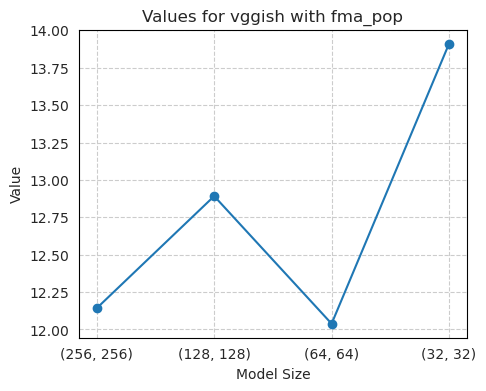

In [119]:
plot_filtered_values(result_df, 'vggish', 'fma_pop')

In [8]:
# df = pd.read_csv('../results/vae_compression_evaluation_results.csv')

# # Split 'latent_dimension' into two new columns
# df[['latent_dimension_x', 'latent_dimension_y']] = df['latent_dimension_x'].str.split('_', expand=True)

# # Convert the new columns to integers
# df['latent_dimension_x'] = df['latent_dimension_x'].astype(int)
# df['latent_dimension_y'] = df['latent_dimension_y'].astype(int)

# # Create a new column for the sum of the two latent dimensions
# df['latent_dimension_sum'] = df['latent_dimension_x'] + df['latent_dimension_y']

# # Sort the DataFrame by the sum of the latent dimensions
# df_sorted = df.sort_values(by='latent_dimension_sum', ascending=False).reset_index(drop=True)

In [11]:
# df_sorted.to_csv('../results/vae_compression_results.csv', index=None)

In [66]:
df = pd.read_csv('../results/vae_compression_evaluation_results.csv')

In [67]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_fad_by_latent_dimension(df, model_names):
    # Set up figure with larger figsize for better visibility
    fig, axes = plt.subplots(1, len(model_names), figsize=(20, 6), sharey=False)
    plt.subplots_adjust(wspace=0.2)

    for i, model_name in enumerate(model_names):
        filtered_df = df[df['model'] == model_name]
        
        if filtered_df.empty:
            print(f"No data available for model: {model_name}")
            continue

        # Create x-labels and sort the data for consistent plotting
        filtered_df['x_label'] = filtered_df['latent_dimension_x'].astype(str) + 'x' + filtered_df['latent_dimension_y'].astype(str)
        filtered_df['dimension_sum'] = filtered_df['latent_dimension_x'] + filtered_df['latent_dimension_y']
        filtered_df = filtered_df.sort_values(by='dimension_sum', ascending=False)

        # Only add the legend on the last subplot
        sns.lineplot(
            data=filtered_df, 
            x='x_label', 
            y='FAD', 
            hue='reference_dataset', 
            marker='o', 
            ax=axes[i],
            legend=(i == len(model_names) - 1)  # Only show legend on the last subplot
        )

        # Set titles, labels, and legends with larger font
        axes[i].set_title(f'{model_name}', fontsize=30)
        
        # Only add the y-axis label on the leftmost subplot
        if i == 0:
            axes[i].set_ylabel('FAD', fontsize=20)
            axes[i].set_xlabel('')
        elif i == 1:
            axes[i].set_xlabel('VAE Latent Dimension', fontsize=20)
            axes[i].set_ylabel('')
        else:
            axes[i].set_ylabel('')
            axes[i].set_xlabel('')
            
        axes[i].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))    
        axes[i].tick_params(axis='x', rotation=0, labelsize=17)
        axes[i].tick_params(axis='y', labelsize=17)
        axes[i].grid(True)

    # Adjust legend properties on the last subplot only
    if len(model_names) > 1:
        axes[-1].legend(title='Reference Dataset', fontsize=18, title_fontsize=28)

    # plt.suptitle("FAD scores for each embedding model", fontsize=18)
    plt.savefig(f'images/for_paper/fad_latent_dimensions.png', dpi=300)
    
    plt.show()


/tmp/ipykernel_1672587/2358005183.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['x_label'] = filtered_df['latent_dimension_x'].astype(str) + 'x' + filtered_df['latent_dimension_y'].astype(str)
/tmp/ipykernel_1672587/2358005183.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['dimension_sum'] = filtered_df['latent_dimension_x'] + filtered_df['latent_dimension_y']
/tmp/ipykernel_1672587/2358005183.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sli

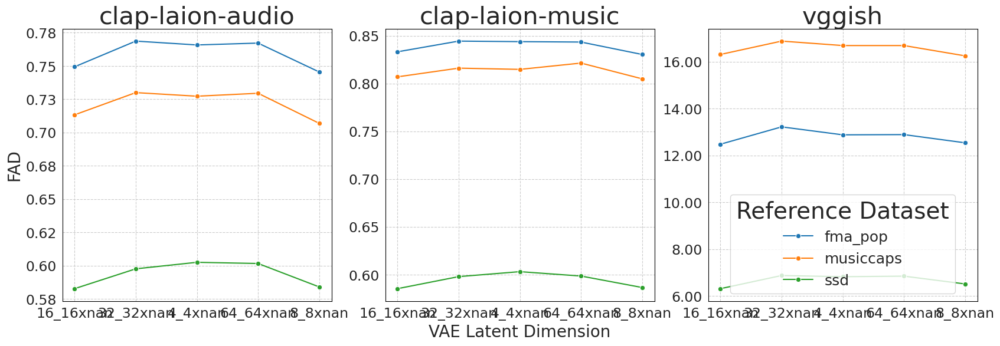

In [68]:
model_names = ['clap-laion-audio', 'clap-laion-music', 'vggish']
plot_fad_by_latent_dimension(df, model_names)

# Load y-resolution experiments from tensorboard pythonically

In [18]:
log_dirs = ['hpc_tensorboard/ra_ssd_256_32/model_step_50000/samples/sch_ddpm_nisteps_1000', 
            'hpc_tensorboard/ra_ssd_256_64/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_256_128/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_256_256/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_256_512/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_512_32/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_512_64/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_512_128/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_512_256/model_step_50000/samples/sch_ddpm_nisteps_1000',
            'hpc_tensorboard/ra_ssd_512_512/model_step_50000/samples/sch_ddpm_nisteps_1000',
]

# new_log_dirs = []

# for log_dir in log_dirs:
#     for ms in [100, 1000, 2500, 5000, 10000, 25000]:
#         new_log_dirs.append(log_dir.replace('model_step_50000', f'model_step_{ms}'))

# log_dirs.extend(new_log_dirs)

            
log_dirs = ["../" + d for d in log_dirs]
log_dirs = [d for d in log_dirs if '/archive' not in d]
log_dirs = [d for d in log_dirs if 'audio' not in d]

In [19]:
log_dirs

['../hpc_tensorboard/ra_ssd_256_32/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_256_64/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_256_128/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_256_256/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_256_512/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_512_32/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_512_64/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_512_128/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_512_256/model_step_50000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/ra_ssd_512_512/model_step_50000/samples/sch_ddpm_nisteps_1000']

In [20]:
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('y_res_scalars.csv', index=False)


In [18]:
result_df = pd.read_csv('../results/y_res_scalars.csv')

In [19]:
result_df['log_dir'][0]

'../hpc_tensorboard/ra_ssd_256_32/model_step_50000/samples/sch_ddpm_nisteps_1000'

In [20]:
def extract_dataset(log_dir):
    return log_dir.split('/')[2].split('_')[1]

def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[2].split('_')[1:])

def extract_model_step(log_dir):
    return int(log_dir.split('/')[3].split('_')[2])

def extract_sampler(log_dir):
    return log_dir.split('/')[-1].split('_')[1]

result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

In [21]:
result_df['resolution'] = result_df['resolution'].apply(lambda x: x[4:])

In [22]:
result_df

,wall_time,step,value,dataset,resolution,model_step,sampler,fad_model,reference_dataset
0,1.724071e+09,0,0.937515,ssd,"256,32",50000,ddpm,clap-laion-audio,spotify_sleep_dataset
1,1.724071e+09,0,0.871899,ssd,"256,32",50000,ddpm,clap-laion-music,spotify_sleep_dataset
2,1.724071e+09,0,6.875633,ssd,"256,32",50000,ddpm,vggish,spotify_sleep_dataset
3,1.724071e+09,0,0.945390,ssd,"256,32",50000,ddpm,clap-laion-audio,fma_pop
4,1.724071e+09,0,1.052287,ssd,"256,32",50000,ddpm,clap-laion-music,fma_pop
...,...,...,...,...,...,...,...,...,...
85,1.724072e+09,0,0.831436,ssd,"512,512",50000,ddpm,clap-laion-music,fma_pop
86,1.724072e+09,0,10.735795,ssd,"512,512",50000,ddpm,vggish,fma_pop
87,1.724072e+09,0,0.681830,ssd,"512,512",50000,ddpm,clap-laion-audio,musiccaps
88,1.724072e+09,0,0.793341,ssd,"512,512",50000,ddpm,clap-laion-music,musiccaps


In [23]:
import matplotlib.pyplot as plt

# Customize the axes and gridlines
sns.set_style("whitegrid", {
    'axes.edgecolor': '0',
    'axes.linewidth': 1.25,
    'grid.color': '.8',
    'grid.linestyle': '--'
})


In [52]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_fad_models(result_df, fad_models, reference_dataset):
    """
    Plots FAD data for multiple fad_models side by side for a given reference dataset.

    Parameters:
        result_df (pd.DataFrame): The DataFrame containing the data to plot.
        fad_models (list): List of fad_models to include in the plots.
        reference_dataset (str): The reference dataset to filter the data.
    """
    num_models = len(fad_models)

    # Create a grid of plots (1 row, num_models columns)
    fig, axs = plt.subplots(1, num_models, figsize=(4 * num_models, 4), squeeze=False)

    for i, fad_model in enumerate(fad_models):
        ax = axs[0, i]

        # Filter the dataframe for the current fad_model and reference_dataset
        filtered_df = result_df[
            (result_df['fad_model'] == fad_model) &
            (result_df['reference_dataset'] == reference_dataset)
        ]
    
        # Extract unique resolution values
        hue_dict = {}
        labels_plotted = set()
        resolution_values = filtered_df['resolution'].unique()

        for resolution in resolution_values:
            resolution_hue, resolution_x = resolution.split(',')
            resolution_hue = int(resolution_hue.strip())
            resolution_x = int(resolution_x.strip())

            if resolution_hue not in hue_dict:
                hue_dict[resolution_hue] = len(hue_dict)

            subset = filtered_df[filtered_df['resolution'].str.startswith(str(resolution_hue))]
            label = f'{resolution_hue}'

            ax.plot(
                subset['resolution'].str.split(',').str[1].astype(int),
                subset['value'],
                label=label if label not in labels_plotted else "",
                color=plt.cm.hsv(hue_dict[resolution_hue] / len(hue_dict))
            )
            labels_plotted.add(label)

        # Set axis labels and ticks
        ax.set_xticks([16, 32, 64, 128, 256, 512])
        ax.set_xticklabels([16, '', 64, 128, 256, 512])
        ax.set_xlabel('Mel-Spec Y-Resolution')

        # Configure y-axis
        if i == 0:
            ax.set_ylabel('FAD')
        else:
            # Keep ticks and gridlines, but remove number labels
            ax.set_yticklabels([])
            ax.grid(axis='y', linestyle='--', alpha=0.7)  # Add horizontal gridlines

        # Add titles or annotations
        ax.set_title(f"{fad_model}")
        ax.set_ylim(0.63,1.05)

    # Create a single legend for the entire figure
    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', title='Sample Length (Pixels)', bbox_to_anchor=(0.9, 0.85))

    # Adjust layout to avoid overlapping and reduce gaps
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, wspace=0.05)  # Reduced wspace to make gaps smaller

    # Save the plot and display
    plt.savefig('../results/plots/y_res.pdf', format='pdf')
    plt.show()


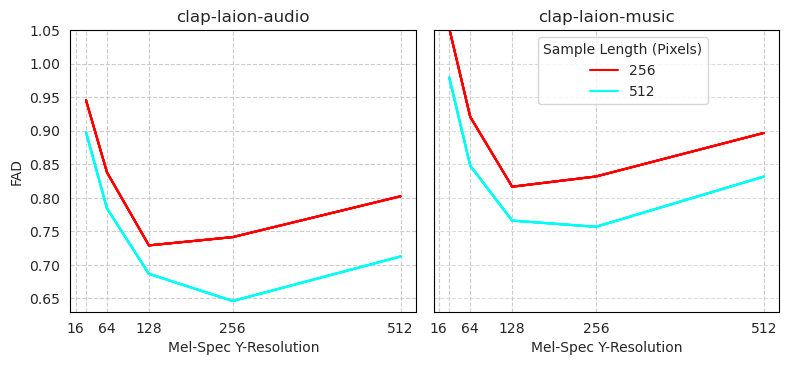

In [53]:
# Example usage:
plot_fad_models(result_df, ['clap-laion-audio', 'clap-laion-music'], "fma_pop")


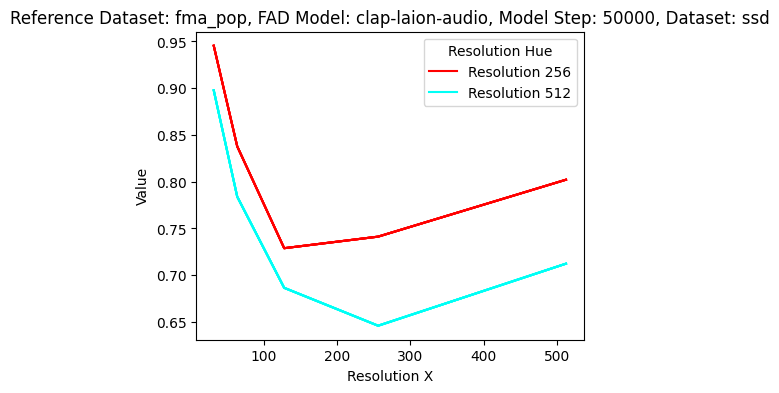

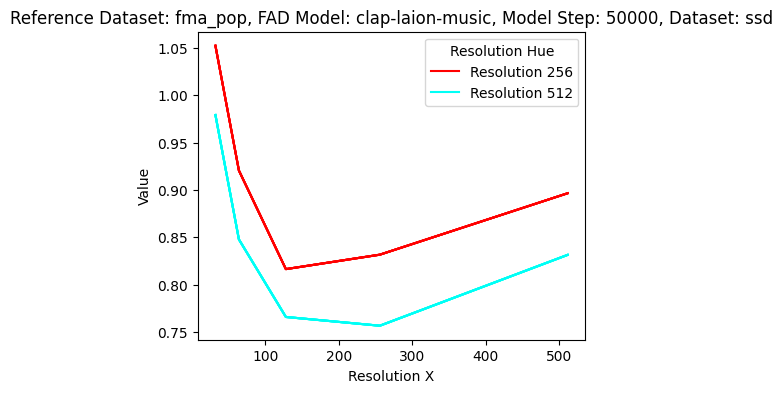

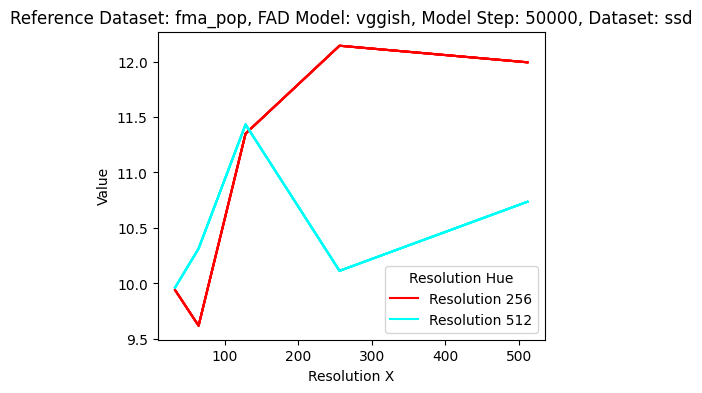

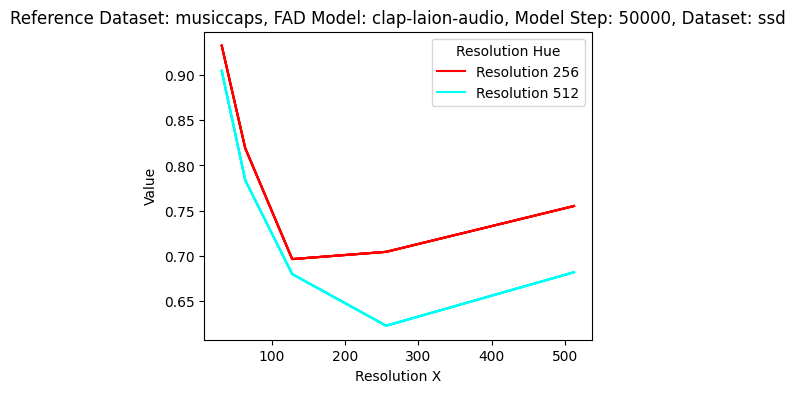

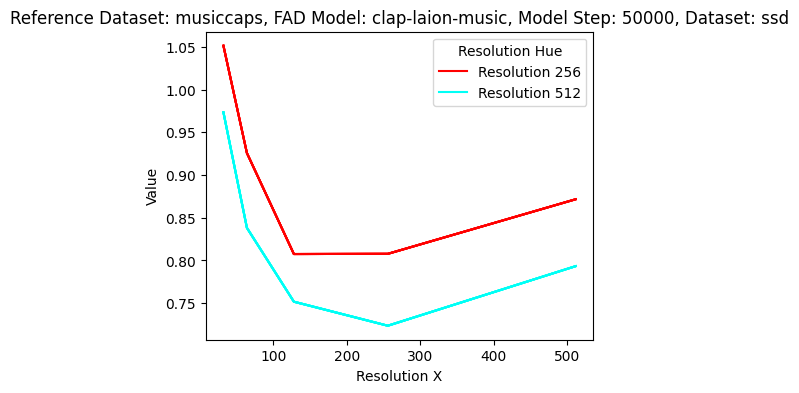

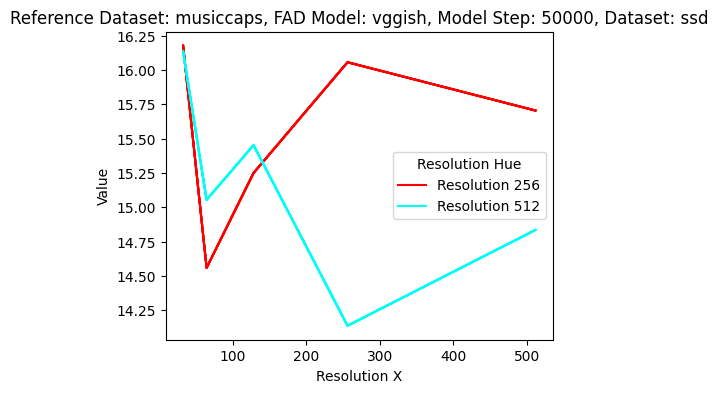

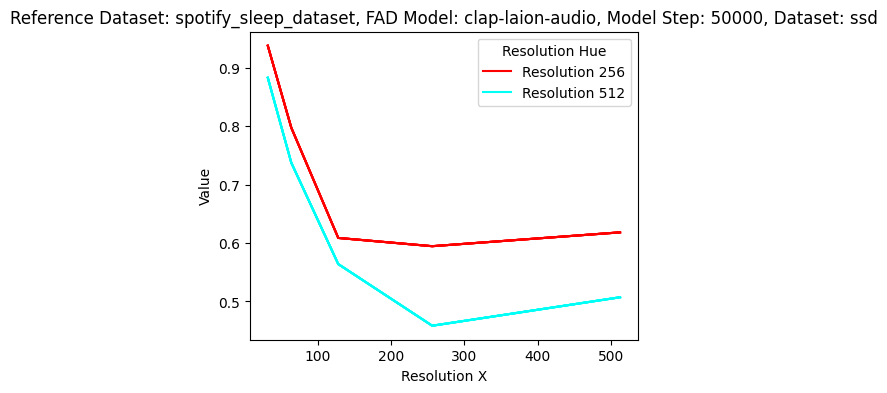

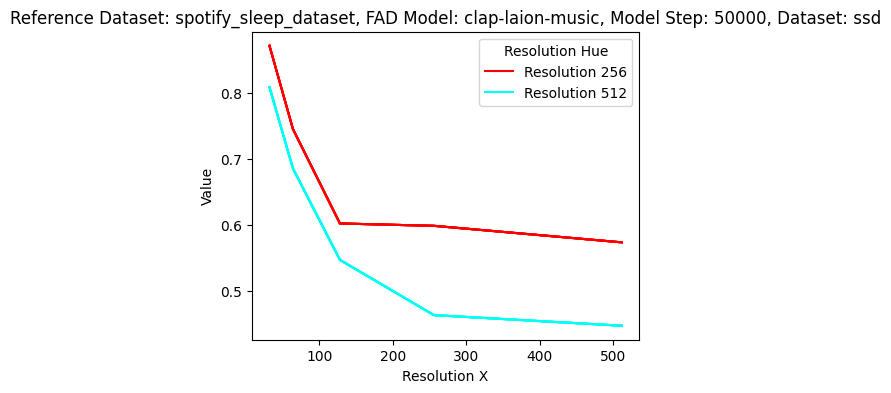

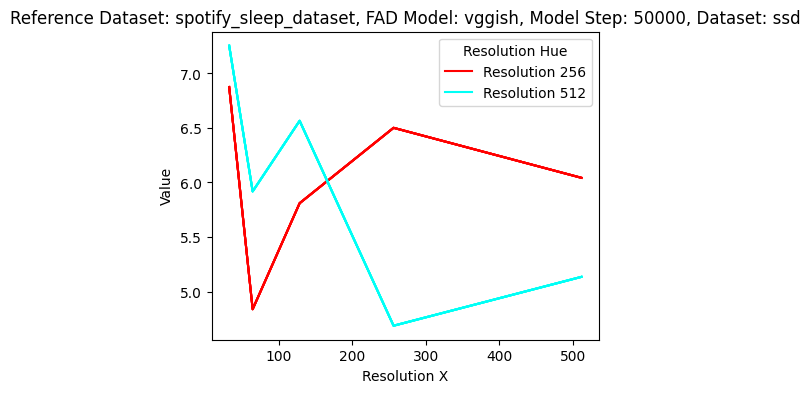

In [22]:
for reference_dataset in ['fma_pop', 'musiccaps', 'spotify_sleep_dataset']:
    for fad_model in ['clap-laion-audio', 'clap-laion-music', 'vggish']:
        plot_filtered_data(result_df, 'ssd', 50000, fad_model, reference_dataset)

,wall_time,step,value,dataset,resolution,model_step,sampler,fad_model,reference_dataset
8,1.724071e+09,0,16.176693,ssd,"256,32",50000,ddpm,vggish,musiccaps
17,1.724071e+09,0,14.559121,ssd,"256,64",50000,ddpm,vggish,musiccaps
26,1.724071e+09,0,15.249970,ssd,"256,128",50000,ddpm,vggish,musiccaps
35,1.724071e+09,0,16.056297,ssd,"256,256",50000,ddpm,vggish,musiccaps
44,1.724071e+09,0,15.704779,ssd,"256,512",50000,ddpm,vggish,musiccaps
53,1.724072e+09,0,16.133417,ssd,"512,32",50000,ddpm,vggish,musiccaps
62,1.724072e+09,0,15.054465,ssd,"512,64",50000,ddpm,vggish,musiccaps
71,1.724072e+09,0,15.452397,ssd,"512,128",50000,ddpm,vggish,musiccaps
80,1.724072e+09,0,14.137584,ssd,"512,256",50000,ddpm,vggish,musiccaps
89,1.724072e+09,0,14.834709,ssd,"512,512",50000,ddpm,vggish,musiccaps


findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: 

findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: 

256 32
256 64
256 128
256 256
256 512
512 32
512 64
512 128
512 256
512 512


findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: 

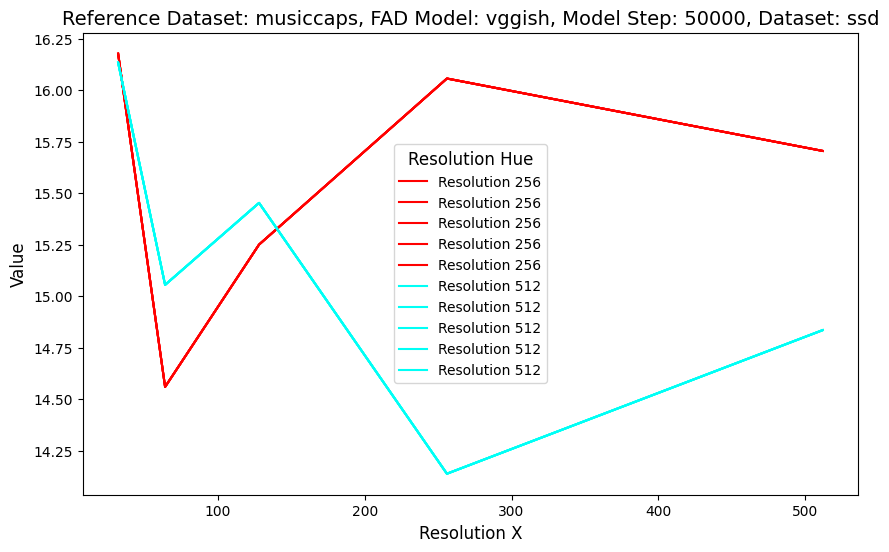

In [33]:
plot_filtered_data(result_df, 'ssd', 50000, 'vggish', 'musiccaps')

In [59]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_filtered_data(result_df, dataset, model_step, fad_model, reference_dataset):
    # Filter the dataframe based on the provided parameters
    filtered_df = result_df[
        (result_df['dataset'] == dataset) &
        (result_df['model_step'] == model_step) &
        (result_df['fad_model'] == fad_model)
    ]
    
    # Extract all unique resolutions from the DataFrame
    unique_resolutions = filtered_df['resolution'].unique()
    
    # Iterate over all possible resolution pairs
    for resolution_pair in unique_resolutions:
        # Split the resolution into two values
        resolution_hue, resolution_x = resolution_pair.split(',')
        
        # Convert the resolution columns to integers (if needed)
        resolution_hue = int(resolution_hue.strip())
        resolution_x = int(resolution_x.strip())
        
        # Filter the DataFrame further by resolution
        resolution_filtered_df = filtered_df[
            (filtered_df['resolution'] == resolution_pair)
        ]
        
        # Create the plot
        plt.figure(figsize=(10, 6))
        
        # Plot the data, using resolution_hue as hue and resolution_x as x-axis
        for hue_value in resolution_filtered_df[resolution_hue].unique():
            subset = resolution_filtered_df[resolution_filtered_df[resolution_hue] == hue_value]
            plt.plot(subset[resolution_x], subset['value'], label=f'Hue: {hue_value}')
        
        # Set the title with all required information
        plt.title(f"Reference Dataset: {reference_dataset}, FAD Model: {fad_model}, "
                  f"Model Step: {model_step}, Dataset: {dataset}, Resolution: {resolution_pair}")
        
        # Set the labels
        plt.xlabel(f'Resolution {resolution_x}')
        plt.ylabel('Value')
        
        # Show legend
        plt.legend(title=f'Resolution {resolution_hue}')
        
        # Show the plot
        plt.show()

# Example usage:
# plot_filtered_data(result_df, 'Dataset_A', 100, 'FAD_Model_1', 'Ref_Dataset_1')


In [60]:
plot_filtered_data(result_df, 'ssd', 50000, 'vggish', 'musiccaps')

# Load BASE results from tensorboard pythonically

In [52]:
log_dirs = ['hpc_tensorboard/models/mc_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_256_256/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_256_256/model_step_2500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/archive/ds_256_256/logs/train_unet', 'hpc_tensorboard/models/archive/mc_64_64/logs/train_unet', 'hpc_tensorboard/models/archive/ds_64_64_testing_hpc/logs/train_unet', 'hpc_tensorboard/models/archive/ds_64_64_testing_hpc/model_step_2000/samples', 'hpc_tensorboard/models/archive/mc_256_256/logs/train_unet', 'hpc_tensorboard/models/archive/ssd_256_256/logs/train_unet', 'hpc_tensorboard/models/archive/ds_64_64/logs/train_unet', 'hpc_tensorboard/models/archive/ssd_64_64/logs/train_unet', 'hpc_tensorboard/models/ds_64_64/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_2500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/samples/audio/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/samples/audio/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_64_64/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_64_64/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_2500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ds_256_256/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ds_256_256/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_2500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_256_256/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_256_256/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_2500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/ssd_64_64/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/ssd_64_64/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_5000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_5000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_40000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_40000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_1000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_1000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_20000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_20000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_100/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_100/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_500/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_10000/samples/sch_ddpm_nisteps_1000', 'hpc_tensorboard/models/mc_64_64/model_step_10000/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_2500/samples/sch_ddim_nisteps_100', 'hpc_tensorboard/models/mc_64_64/model_step_2500/samples/sch_ddpm_nisteps_1000']

log_dirs = ["../" + d for d in log_dirs]
log_dirs = [d for d in log_dirs if '/archive' not in d]
log_dirs = [d for d in log_dirs if 'audio' not in d]
ds_64_64_dirs = [d for d in log_dirs if '/ds_64_64' in d]
ds_256_256_dirs = [d for d in log_dirs if '/ds_256_256' in d]
mc_64_64_dirs = [d for d in log_dirs if '/mc_64_64' in d]
mc_256_256_dirs = [d for d in log_dirs if '/mc_256_256' in d]
ssd_64_64_dirs = [d for d in log_dirs if '/ssd_64_64' in d]
ssd_256_256_dirs = [d for d in log_dirs if '/ssd_256_256' in d]
all_dirs = [ds_64_64_dirs, ds_256_256_dirs, mc_64_64_dirs, mc_256_256_dirs, ssd_64_64_dirs, ssd_256_256_dirs]

In [53]:
ds_64_64_dirs

['../hpc_tensorboard/models/ds_64_64/model_step_500/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ds_64_64/model_step_500/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_10000/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_10000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ds_64_64/model_step_2500/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ds_64_64/model_step_2500/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_40000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ds_64_64/model_step_40000/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_5000/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_5000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ds_64_64/model_step_1000/samples/sch_ddim_nisteps_100',
 '../hpc_tensorboard/models/ds_64_64/model_step_1000/samples/sch_ddpm

In [58]:
all_scalars = []

for dir_list in all_dirs:
    for log_dir in dir_list:
        scalars = extract_scalars(log_dir)
        for tag, values in scalars.items():
            df = pd.DataFrame(values)
            df['log_dir'] = log_dir
            df['tag'] = tag
            all_scalars.append(df)

result_df = pd.concat(all_scalars, ignore_index=True)

result_df.to_csv('scalars.csv', index=False)


In [60]:
def extract_dataset(log_dir):
    return log_dir.split('/')[3].split('_')[0]

def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[3].split('_')[1:])

def extract_model_step(log_dir):
    return log_dir.split('/')[4].split('_')[2]

def extract_sampler(log_dir):
    return log_dir.split('/')[-1].split('_')[1]

result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)

def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

result_df.drop(columns=['log_dir', 'tag'], inplace=True)

['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_ddpm_nisteps_1000']
['..', 'hpc_tensorboard', 'models', 'ds_64_64', 'model_step_500', 'samples', 'sch_

In [86]:
result_df['model_step'] = result_df['model_step'].astype(int)

In [65]:
result_df.to_csv('../results/base_evaluation_results.csv')

In [146]:
result_df[(result_df['dataset'] == 'ds') & (result_df['reference_dataset'] == 'drum_samples')]

,wall_time,step,value,dataset,resolution,model_step,sampler,fad_model,reference_dataset
0,1.716267e+09,0,0.392850,ds,"64,64",500,ddpm,clap-laion-audio,drum_samples
1,1.716267e+09,0,0.430554,ds,"64,64",500,ddpm,clap-laion-music,drum_samples
2,1.716267e+09,0,11.005616,ds,"64,64",500,ddpm,encodec-emb-48k,drum_samples
3,1.716267e+09,0,58.339176,ds,"64,64",500,ddpm,encodec-emb,drum_samples
4,1.716267e+09,0,48.432827,ds,"64,64",500,ddpm,MERT-v1-95M,drum_samples
...,...,...,...,...,...,...,...,...,...
521,1.716263e+09,0,0.443980,ds,"256,256",20000,ddpm,clap-laion-music,drum_samples
522,1.716263e+09,0,12.806067,ds,"256,256",20000,ddpm,vggish,drum_samples
523,1.716263e+09,0,18.219641,ds,"256,256",20000,ddpm,encodec-emb-48k,drum_samples
524,1.716263e+09,0,65.952942,ds,"256,256",20000,ddpm,encodec-emb,drum_samples


In [147]:
columns_to_check = ['dataset', 'resolution', 'model_step', 'sampler', 'fad_model', 'reference_dataset']
duplicate_rows = result_df[result_df.duplicated(subset=columns_to_check, keep=False)]

duplicate_rows

,wall_time,step,value,dataset,resolution,model_step,sampler,fad_model,reference_dataset
75,1.716242e+09,0,0.304784,ds,"64,64",2500,ddim,clap-laion-audio,drum_samples
76,1.716267e+09,0,0.304787,ds,"64,64",2500,ddim,clap-laion-audio,drum_samples
77,1.716242e+09,0,0.344378,ds,"64,64",2500,ddim,clap-laion-music,drum_samples
78,1.716267e+09,0,0.344403,ds,"64,64",2500,ddim,clap-laion-music,drum_samples
293,1.716242e+09,0,0.427110,ds,"256,256",10000,ddim,clap-laion-audio,drum_samples
294,1.716253e+09,0,0.427070,ds,"256,256",10000,ddim,clap-laion-audio,drum_samples
295,1.716242e+09,0,0.517897,ds,"256,256",10000,ddim,clap-laion-music,drum_samples
296,1.716253e+09,0,0.517889,ds,"256,256",10000,ddim,clap-laion-music,drum_samples
297,1.716242e+09,0,27.249901,ds,"256,256",10000,ddim,encodec-emb-48k,drum_samples
298,1.716253e+09,0,13.074430,ds,"256,256",10000,ddim,encodec-emb-48k,drum_samples


In [ ]:
51.340725 ds	256,256	10000	ddim	encodec-emb	drum_samples

27.249901 ds	256,256	10000	ddim	encodec-emb-48k	drum_samples

In [148]:
rows_to_remove = [
    [51.340725, 'ds', '256,256', '10000', 'ddim', 'encodec-emb', 'drum_samples'],
    [27.249901, 'ds', '256,256', '10000', 'ddim', 'encodec-emb-48k', 'drum_samples']
]

# Convert the list of rows to a DataFrame for easy comparison
rows_to_remove_df = pd.DataFrame(rows_to_remove, columns=['value', 'dataset', 'resolution', 'model_step', 'sampler', 'fad_model', 'reference_dataset'])


In [149]:
result_df_filtered = result_df[~result_df.isin(rows_to_remove_df.to_dict(orient='list')).all(axis=1)]

In [151]:
columns_to_check = ['dataset', 'resolution', 'model_step', 'sampler', 'fad_model', 'reference_dataset']
duplicate_rows = result_df_filtered[result_df_filtered.duplicated(subset=columns_to_check, keep=False)]

duplicate_rows

,wall_time,step,value,dataset,resolution,model_step,sampler,fad_model,reference_dataset
75,1.716242e+09,0,0.304784,ds,"64,64",2500,ddim,clap-laion-audio,drum_samples
76,1.716267e+09,0,0.304787,ds,"64,64",2500,ddim,clap-laion-audio,drum_samples
77,1.716242e+09,0,0.344378,ds,"64,64",2500,ddim,clap-laion-music,drum_samples
78,1.716267e+09,0,0.344403,ds,"64,64",2500,ddim,clap-laion-music,drum_samples
293,1.716242e+09,0,0.427110,ds,"256,256",10000,ddim,clap-laion-audio,drum_samples
294,1.716253e+09,0,0.427070,ds,"256,256",10000,ddim,clap-laion-audio,drum_samples
295,1.716242e+09,0,0.517897,ds,"256,256",10000,ddim,clap-laion-music,drum_samples
296,1.716253e+09,0,0.517889,ds,"256,256",10000,ddim,clap-laion-music,drum_samples
297,1.716242e+09,0,27.249901,ds,"256,256",10000,ddim,encodec-emb-48k,drum_samples
298,1.716253e+09,0,13.074430,ds,"256,256",10000,ddim,encodec-emb-48k,drum_samples


In [2]:
result_df = pd.read_csv('../results/base_evaluation_results.csv')

In [159]:
# result_df.to_csv('../results/base_evaluation_results.csv')

drum samples cross reference - vggish - 0.17949207689641256
drum samples cross reference - clap-laion-audio - 0.014324303916341208

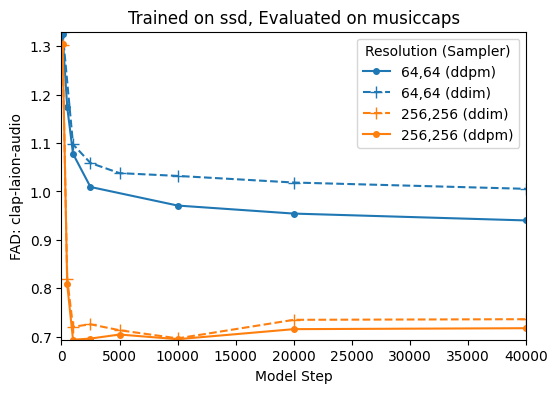

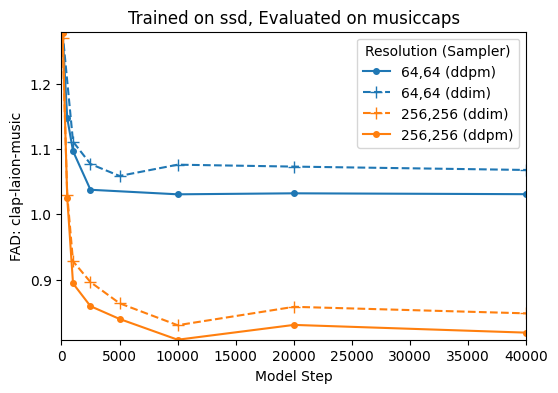

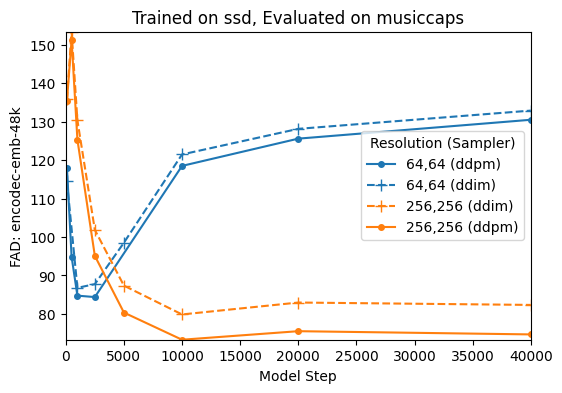

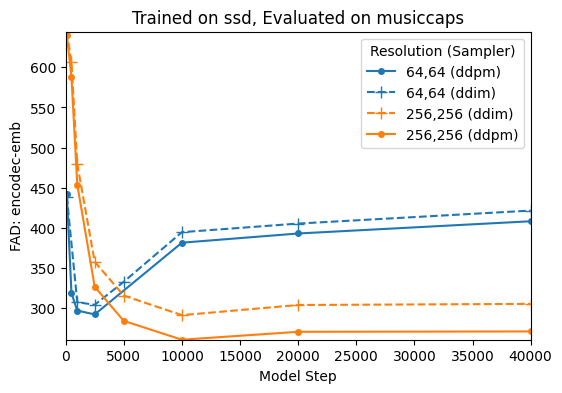

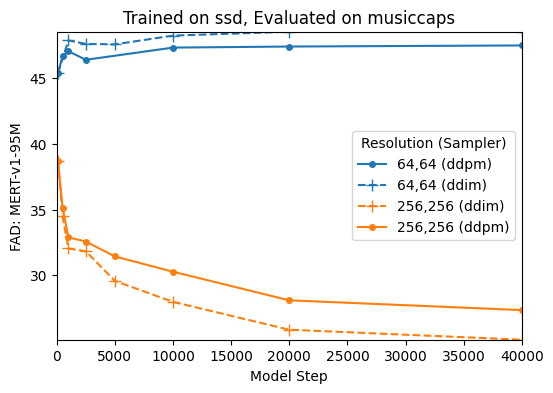

...

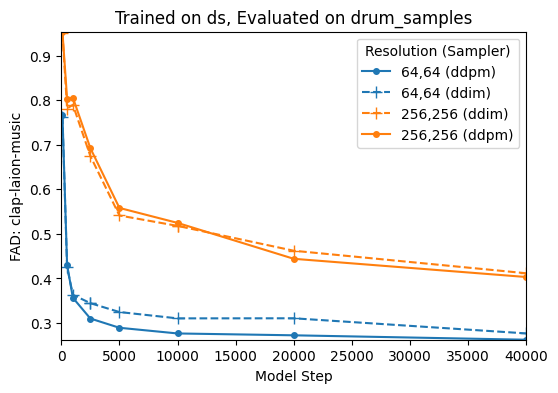

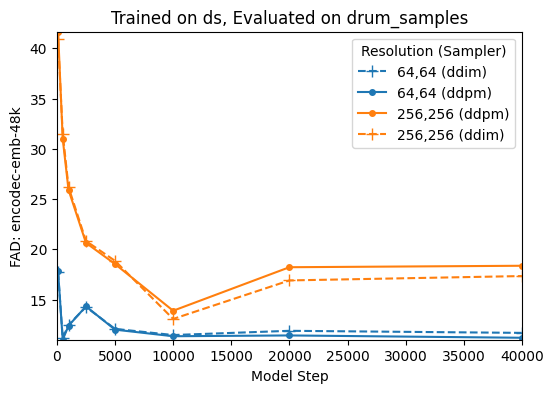

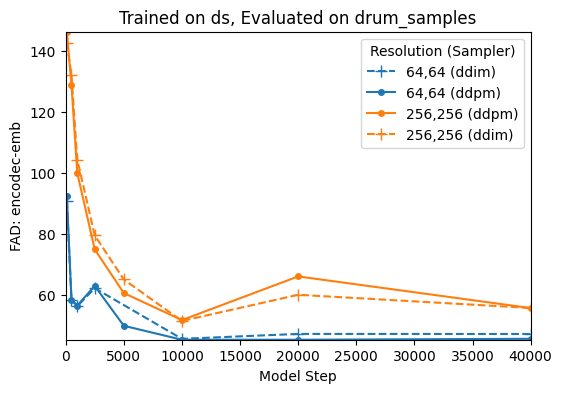

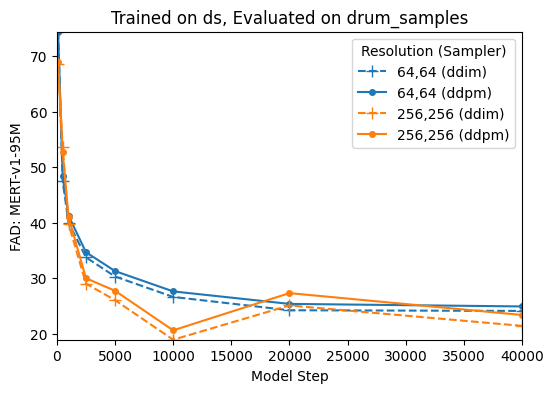

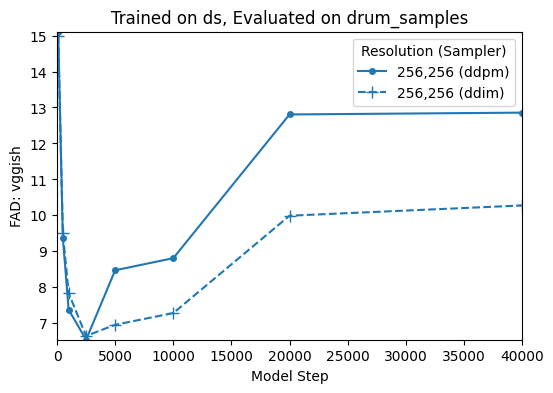

In [160]:
datasets = ['ssd', 'mc', 'ds']
reference_datasets = ['musiccaps', 'fma_pop', 'spotify_sleep_dataset', 'drum_samples']
models = ['clap-laion-audio', 'clap-laion-music', 'encodec-emb-48k', 'encodec-emb', 'MERT-v1-95M', 'vggish']

for d in datasets:
    for r in reference_datasets:
        for m in models:
            plot_fad_scores(result_df, d, r, m)

        

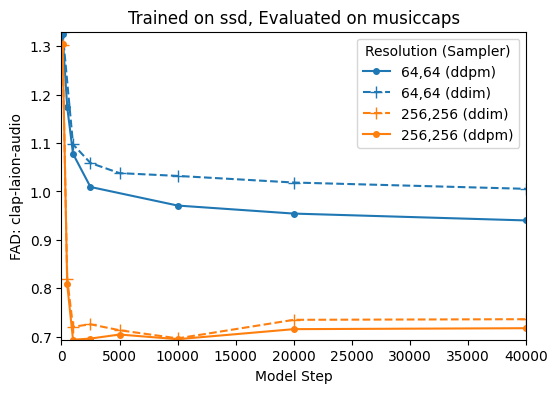

In [132]:
plot_fad_scores(result_df, 'ssd', 'musiccaps', 'clap-laion-audio')

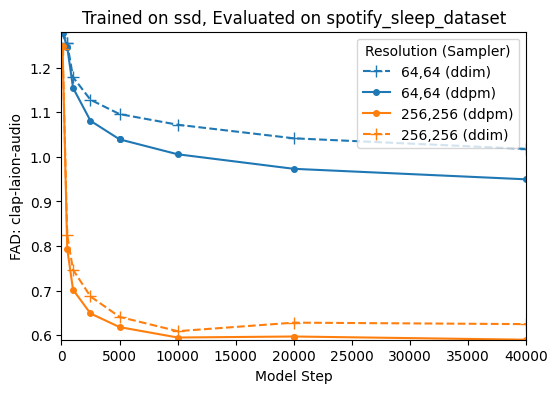

In [133]:
plot_fad_scores(result_df, 'ssd', 'spotify_sleep_dataset', 'clap-laion-audio')

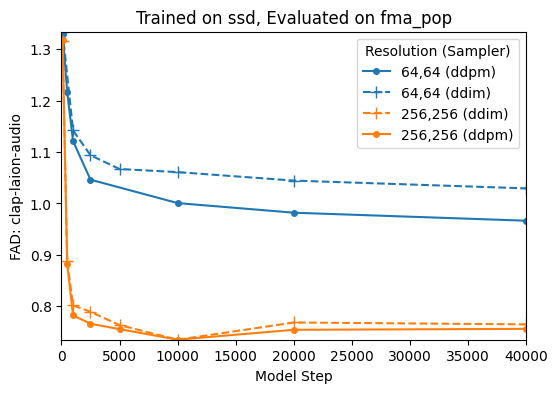

In [134]:
plot_fad_scores(result_df, 'ssd', 'fma_pop', 'clap-laion-audio')

# Load VAE results pythonically

In [23]:
log_dirs = []
for base_model in ['vae_ds_256_256', 'vae_ssd_256_256', 'vae_mc_256_256']:
    for model_step in [100, 500, 1000, 2500, 5000, 10000, 20000, 40000]:
        for inf_path in ['sch_ddpm_nisteps_1000', 'sch_ddim_nisteps_100']:
            path = f'hpc_tensorboard/models/{base_model}/model_step_{model_step}/samples/{inf_path}/'
            log_dirs.append(path)

In [24]:
log_dirs

['hpc_tensorboard/models/vae_ds_256_256/model_step_100/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_100/samples/sch_ddim_nisteps_100/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_500/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_500/samples/sch_ddim_nisteps_100/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_1000/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_1000/samples/sch_ddim_nisteps_100/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_2500/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_2500/samples/sch_ddim_nisteps_100/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_5000/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_5000/samples/sch_ddim_nisteps_100/',
 'hpc_tensorboard/models/vae_ds_256_256/model_step_10000/samples/sch_ddpm_nisteps_1000/',
 'hpc_tensorboard/models/vae_

In [25]:
# log_dirs = [
#     'hpc_tensorboard/models/vae_ds_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000/',
#     'hpc_tensorboard/models/vae_ds_256_256/model_step_40000/samples/sch_ddim_nisteps_100/',
#     'hpc_tensorboard/models/vae_ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000/',
#     'hpc_tensorboard/models/vae_ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100/',
#     'hpc_tensorboard/models/vae_mc_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000/',
#     'hpc_tensorboard/models/vae_mc_256_256/model_step_40000/samples/sch_ddim_nisteps_100/'
# ]
          
log_dirs = ["../" + d for d in log_dirs]
log_dirs = [d for d in log_dirs if '/archive' not in d]
log_dirs = [d for d in log_dirs if 'audio' not in d]
vae_ds_dirs = [d for d in log_dirs if '/vae_ds' in d]
vae_ssd_dirs = [d for d in log_dirs if '/vae_ssd' in d]
vae_mc_dirs = [d for d in log_dirs if '/vae_mc' in d]
all_dirs = [vae_ds_dirs, vae_ssd_dirs, vae_mc_dirs]

In [43]:
# Extract scalars from all directories and combine into a single DataFrame
all_scalars = []

for dir_list in all_dirs:
    for log_dir in dir_list:
        print(log_dir)
        scalars = extract_scalars(log_dir)
        for tag, values in scalars.items():
            df = pd.DataFrame(values)
            df['log_dir'] = log_dir
            df['tag'] = tag
            all_scalars.append(df)

# Combine all dataframes
result_df = pd.concat(all_scalars, ignore_index=True)

# Save the DataFrame to a CSV file
result_df.to_csv('vae_scalars.csv', index=False)


../hpc_tensorboard/models/vae_ds_256_256/model_step_100/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256/model_step_100/samples/sch_ddim_nisteps_100/
../hpc_tensorboard/models/vae_ds_256_256/model_step_500/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256/model_step_500/samples/sch_ddim_nisteps_100/
../hpc_tensorboard/models/vae_ds_256_256/model_step_1000/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256/model_step_1000/samples/sch_ddim_nisteps_100/
../hpc_tensorboard/models/vae_ds_256_256/model_step_2500/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256/model_step_2500/samples/sch_ddim_nisteps_100/
../hpc_tensorboard/models/vae_ds_256_256/model_step_5000/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256/model_step_5000/samples/sch_ddim_nisteps_100/
../hpc_tensorboard/models/vae_ds_256_256/model_step_10000/samples/sch_ddpm_nisteps_1000/
../hpc_tensorboard/models/vae_ds_256_256

In [44]:
# Function to extract dataset
def extract_dataset(log_dir):
    if 'vae' not in log_dir:
        return log_dir.split('/')[3].split('_')[0]
    else:
        return log_dir.split('/')[3].split('_')[1]

# Function to extract resolution
def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[3].split('_')[2:])

# Function to extract model_step
def extract_model_step(log_dir):
    print(log_dir.split('/')[4].split('_')[2])
    return log_dir.split('/')[4].split('_')[2]

# Function to extract sampler
def extract_sampler(log_dir):
    return log_dir.split('/')[-2].split('_')[1]

# Function to extract sampler
def extract_vae(log_dir):
    if 'vae' in log_dir:
        return log_dir.split('/')[3].split('_')[0]
    else:
        return None


# Apply the functions to create new columns
result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)
result_df['vae'] = result_df['log_dir'].apply(extract_vae)

# Function to extract fad_model
def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

# Function to extract reference_dataset
def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

# Apply the functions to create new columns
result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

# Drop the original 'log_dir' and 'tag' columns if no longer needed
result_df.drop(columns=['log_dir', 'tag'], inplace=True)

# import ace_tools as tools; tools.display_dataframe_to_user(name="Cleaned Results DataFrame", dataframe=result_df)


100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
1000
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
2500
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
5000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
40000
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100

In [45]:
result_df

,wall_time,step,value,dataset,resolution,model_step,sampler,vae,fad_model,reference_dataset
0,1.716550e+09,0,1.174449,ds,"256,256",100,ddpm,vae,clap-laion-audio,fma_pop
1,1.716550e+09,0,1.160421,ds,"256,256",100,ddpm,vae,clap-laion-music,fma_pop
2,1.716550e+09,0,19.601179,ds,"256,256",100,ddpm,vae,vggish,fma_pop
3,1.716550e+09,0,1.123486,ds,"256,256",100,ddpm,vae,clap-laion-audio,musiccaps
4,1.716550e+09,0,1.078583,ds,"256,256",100,ddpm,vae,clap-laion-music,musiccaps
...,...,...,...,...,...,...,...,...,...,...
572,1.716454e+09,0,0.795302,mc,"256,256",40000,ddim,vae,clap-laion-music,fma_pop
573,1.716454e+09,0,10.099151,mc,"256,256",40000,ddim,vae,vggish,fma_pop
574,1.716454e+09,0,0.579356,mc,"256,256",40000,ddim,vae,clap-laion-audio,musiccaps
575,1.716454e+09,0,0.711340,mc,"256,256",40000,ddim,vae,clap-laion-music,musiccaps


In [47]:
result_df[result_df['model_step'] == '40000']

,wall_time,step,value,dataset,resolution,model_step,sampler,vae,fad_model,reference_dataset
157,1.716453e+09,0,0.426187,ds,"256,256",40000,ddpm,vae,clap-laion-audio,drum_samples
158,1.716453e+09,0,0.488804,ds,"256,256",40000,ddpm,vae,clap-laion-music,drum_samples
159,1.716453e+09,0,5.639660,ds,"256,256",40000,ddpm,vae,vggish,drum_samples
160,1.716453e+09,0,1.333413,ds,"256,256",40000,ddpm,vae,clap-laion-audio,fma_pop
161,1.716453e+09,0,1.353575,ds,"256,256",40000,ddpm,vae,clap-laion-music,fma_pop
162,1.716454e+09,0,16.386065,ds,"256,256",40000,ddpm,vae,vggish,fma_pop
163,1.716454e+09,0,1.338016,ds,"256,256",40000,ddpm,vae,clap-laion-audio,musiccaps
164,1.716454e+09,0,1.396448,ds,"256,256",40000,ddpm,vae,clap-laion-music,musiccaps
165,1.716454e+09,0,24.008320,ds,"256,256",40000,ddpm,vae,vggish,musiccaps
166,1.716453e+09,0,0.428101,ds,"256,256",40000,ddim,vae,clap-laion-audio,drum_samples


In [96]:
result_df.to_csv('../results/vae_evaluation_results.csv')

In [49]:
vae_result_df = pd.read_csv('../results/vae_evaluation_results.csv')
base_result_df = pd.read_csv('../results/base_evaluation_results.csv')

In [50]:
concat_df = pd.concat([vae_result_df, base_result_df])

In [51]:
concat_df

,Unnamed: 0,wall_time,step,value,dataset,resolution,model_step,sampler,vae,fad_model,reference_dataset
0,0,1.716550e+09,0,1.174449,ds,"256,256",100,ddpm,vae,clap-laion-audio,fma_pop
1,1,1.716550e+09,0,1.160421,ds,"256,256",100,ddpm,vae,clap-laion-music,fma_pop
2,2,1.716550e+09,0,19.601179,ds,"256,256",100,ddpm,vae,vggish,fma_pop
3,3,1.716550e+09,0,1.123486,ds,"256,256",100,ddpm,vae,clap-laion-audio,musiccaps
4,4,1.716550e+09,0,1.078583,ds,"256,256",100,ddpm,vae,clap-laion-music,musiccaps
...,...,...,...,...,...,...,...,...,...,...,...
1397,1399,1.716266e+09,0,1.278465,ssd,"256,256",100,ddpm,NaN,clap-laion-music,musiccaps
1398,1400,1.716266e+09,0,24.246433,ssd,"256,256",100,ddpm,NaN,vggish,musiccaps
1399,1401,1.716267e+09,0,135.416168,ssd,"256,256",100,ddpm,NaN,encodec-emb-48k,musiccaps
1400,1402,1.716267e+09,0,640.542419,ssd,"256,256",100,ddpm,NaN,encodec-emb,musiccaps


In [ ]:
datasets = ['ssd', 'mc', 'ds']
reference_datasets = ['musiccaps', 'fma_pop', 'spotify_sleep_dataset', 'drum_samples']
models = ['clap-laion-audio', 'clap-laion-music', 'encodec-emb-48k', 'encodec-emb', 'MERT-v1-95M', 'vggish']

for d in datasets:
    for r in reference_datasets:
        for m in models:
            plot_fad_scores_w_vae(result_df, d, r, m)

In [52]:
plot_fad_scores_w_vae(concat_df, 'ssd', 'spotify_sleep_dataset', 'vggish', plot_vae=True)

/tmp/ipykernel_1727052/3991364001.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_vae = plt.cm.get_cmap('Pastel1')(np.arange(len(resolutions)))


RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp4tkal6l8 79312b8cb968fd75b1512f99d68eec6b.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./79312b8cb968fd75b1512f99d68eec6b.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.7 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmp4tkal6l8/79312b8cb968fd75b1512f99d68eec6b.log.




Error in callback <function _draw_all_if_interactive at 0x7625db05a020> (for post_execute), with arguments args (),kwargs {}:


RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp2wjfjplj 79312b8cb968fd75b1512f99d68eec6b.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./79312b8cb968fd75b1512f99d68eec6b.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.7 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmp2wjfjplj/79312b8cb968fd75b1512f99d68eec6b.log.




RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp7kj3a7ev 79312b8cb968fd75b1512f99d68eec6b.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./79312b8cb968fd75b1512f99d68eec6b.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.7 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmp7kj3a7ev/79312b8cb968fd75b1512f99d68eec6b.log.




<Figure size 600x400 with 1 Axes>

/tmp/ipykernel_2674152/1244241188.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_vae = plt.cm.get_cmap('Pastel1')(np.arange(len(resolutions)))


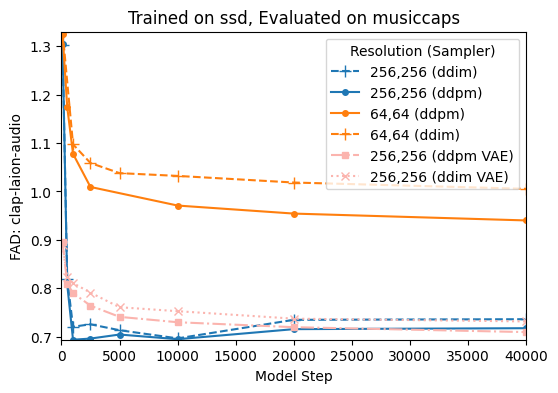

In [73]:
plot_fad_scores_w_vae(concat_df, 'ssd', 'musiccaps', 'clap-laion-audio')

/tmp/ipykernel_2674152/1244241188.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_vae = plt.cm.get_cmap('Pastel1')(np.arange(len(resolutions)))


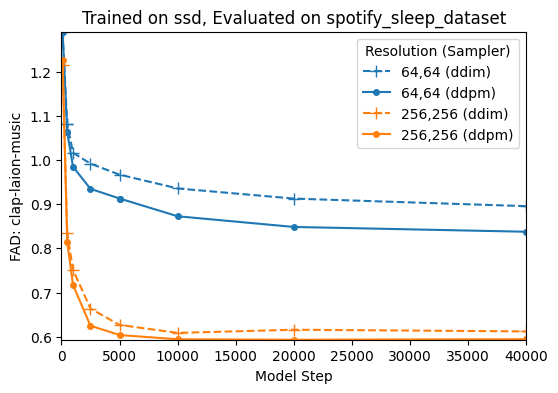

In [79]:
plot_fad_scores_w_vae(concat_df, 'ssd', 'spotify_sleep_dataset', 'clap-laion-music')

/tmp/ipykernel_2674152/1244241188.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_vae = plt.cm.get_cmap('Pastel1')(np.arange(len(resolutions)))


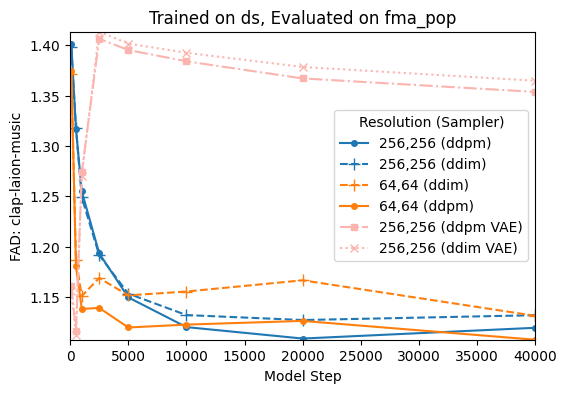

In [78]:
plot_fad_scores_w_vae(concat_df, 'ds', 'fma_pop', 'clap-laion-music')

In [80]:
concat_df

,Unnamed: 0,wall_time,step,value,dataset,resolution,model_step,sampler,vae,fad_model,reference_dataset
0,0,1.716550e+09,0,1.174449,ds,"256,256",100,ddpm,vae,clap-laion-audio,fma_pop
1,1,1.716550e+09,0,1.160421,ds,"256,256",100,ddpm,vae,clap-laion-music,fma_pop
2,2,1.716550e+09,0,19.601179,ds,"256,256",100,ddpm,vae,vggish,fma_pop
3,3,1.716550e+09,0,1.123486,ds,"256,256",100,ddpm,vae,clap-laion-audio,musiccaps
4,4,1.716550e+09,0,1.078583,ds,"256,256",100,ddpm,vae,clap-laion-music,musiccaps
...,...,...,...,...,...,...,...,...,...,...,...
1397,1399,1.716266e+09,0,1.278465,ssd,"256,256",100,ddpm,NaN,clap-laion-music,musiccaps
1398,1400,1.716266e+09,0,24.246433,ssd,"256,256",100,ddpm,NaN,vggish,musiccaps
1399,1401,1.716267e+09,0,135.416168,ssd,"256,256",100,ddpm,NaN,encodec-emb-48k,musiccaps
1400,1402,1.716267e+09,0,640.542419,ssd,"256,256",100,ddpm,NaN,encodec-emb,musiccaps


# Long SSD experiments 

In [28]:
log_dirs = []
for base_model in ['ssd_256_256', 'ssd_512_32', 'ssd_512_64', 'ssd_512_128', 'ssd_64_64', 'ssd_1024_128', 'vae_ssd_256_256', ]:
    for model_step in [40000]:
        for inf_path in ['sch_ddpm_nisteps_1000', 'sch_ddim_nisteps_100']:
            path = f'hpc_tensorboard/models/{base_model}/model_step_{model_step}/samples/{inf_path}'
            log_dirs.append(path)

In [29]:
log_dirs = ["../" + d for d in log_dirs]
log_dirs = [d for d in log_dirs if '/archive' not in d]
log_dirs = [d for d in log_dirs if 'audio' not in d]
ssd_512_32_dirs = [d for d in log_dirs if '512_32' in d]
ssd_512_64_dirs = [d for d in log_dirs if '512_64' in d]
ssd_512_128_dirs = [d for d in log_dirs if '512_128' in d]
ssd_64_64_dirs = [d for d in log_dirs if '64_64' in d]
ssd_256_256_dirs = [d for d in log_dirs if '256_256' in d]
ssd_1024_128_dirs = [d for d in log_dirs if '1024_128' in d]
all_dirs = [ssd_512_32_dirs, ssd_512_64_dirs, ssd_512_128_dirs, ssd_64_64_dirs, ssd_256_256_dirs, ssd_1024_128_dirs]

In [30]:
# Extract scalars from all directories and combine into a single DataFrame
all_scalars = []

for dir_list in all_dirs:
    for log_dir in dir_list:
        print(log_dir)

        scalars = extract_scalars(log_dir)
        for tag, values in scalars.items():
            df = pd.DataFrame(values)
            df['log_dir'] = log_dir
            df['tag'] = tag
            all_scalars.append(df)

# Combine all dataframes
result_df = pd.concat(all_scalars, ignore_index=True)

# Save the DataFrame to a CSV file
result_df.to_csv('long_ssd_scalars_updated.csv', index=False)


../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_512_64/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_64/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_64_64/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_64_64/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/vae_ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/vae_ssd_256_256/model_step_40000/samples/sch_ddi

In [31]:
result_df['log_dir'][0]

'../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000'

In [32]:
# Function to extract dataset
def extract_dataset(log_dir):
    return log_dir.split('/')[3].split('_')[0]

# Function to extract resolution
def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[3].split('_')[1:])

# Function to extract model_step
def extract_model_step(log_dir):
    return log_dir.split('/')[4].split('_')[2]

# Function to extract sampler
def extract_sampler(log_dir):
    return log_dir.split('/')[-1].split('_')[1]

def extract_vae(log_dir):
    return 'vae' in log_dir

def get_inference_time(log_dir):
    print(log_dir)
    
    if  'ddim' in log_dir and 'vae_ssd_256_256' in log_dir: return 0.008
    elif 'ddpm' in log_dir and 'vae_ssd_256_256' in log_dir: return 0.116
    
    elif 'ddim' in log_dir and '64_64' in log_dir: return 0.0743
    elif 'ddpm' in log_dir and '64_64' in log_dir: return 1.162
    
    elif 'ddim' in log_dir and '256_256' in log_dir: return 0.370
    elif 'ddpm' in log_dir and '256_256' in log_dir: return 3.784
    
    elif 'ddim' in log_dir and '512_32' in log_dir: return 0.0474
    elif 'ddpm' in log_dir and '512_32' in log_dir: return 0.528
    
    elif 'ddim' in log_dir and '512_64' in log_dir: return 0.092
    elif 'ddpm' in log_dir and '512_64' in log_dir: return 0.951
    
    elif 'ddim' in log_dir and '512_128' in log_dir: return 0.187
    elif 'ddpm' in log_dir and '512_128' in log_dir: return 1.894
    
    elif 'ddim' in log_dir and '1024_128' in log_dir: return 0.195
    elif 'ddpm' in log_dir and '1024_128' in log_dir: return 1.975


# Apply the functions to create new columns
result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)
result_df['inference_time'] = result_df['log_dir'].apply(get_inference_time)
result_df['vae'] = result_df['log_dir'].apply(extract_vae)

# Function to extract fad_model
def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

# Function to extract reference_dataset
def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

# Apply the functions to create new columns
result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

# Drop the original 'log_dir' and 'tag' columns if no longer needed
# result_df.drop(columns=['log_dir', 'tag'], inplace=True)

# import ace_tools as tools; tools.display_dataframe_to_user(name="Cleaned Results DataFrame", dataframe=result_df)


../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_512_32/model_step_40000/samples/sch_ddim_nisteps

In [35]:
result_df[result_df['resolution'] == '512,32']

,wall_time,step,value,log_dir,tag,dataset,resolution,model_step,sampler,inference_time,vae,fad_model,reference_dataset
0,1.716554e+09,0,0.883853,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-audio_ref_spotify_sleep_dataset...,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-audio,spotify_sleep_dataset
1,1.716554e+09,0,0.810608,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-music_ref_spotify_sleep_dataset...,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-music,spotify_sleep_dataset
2,1.716554e+09,0,7.464810,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_vggish_ref_spotify_sleep_dataset_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,vggish,spotify_sleep_dataset
3,1.716554e+09,0,0.891958,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-audio_ref_fma_pop_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-audio,fma_pop
4,1.716554e+09,0,0.968335,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-music_ref_fma_pop_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-music,fma_pop
5,1.716554e+09,0,10.080668,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_vggish_ref_fma_pop_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,vggish,fma_pop
6,1.716554e+09,0,0.900143,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-audio_ref_musiccaps_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-audio,musiccaps
7,1.716554e+09,0,0.962323,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-music_ref_musiccaps_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,clap-laion-music,musiccaps
8,1.716554e+09,0,16.329153,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_vggish_ref_musiccaps_gen_None,ssd,"512,32",40000,ddpm,0.5280,False,vggish,musiccaps
9,1.716554e+09,0,0.961064,../hpc_tensorboard/models/ssd_512_32/model_ste...,fad_clap-laion-audio_ref_spotify_sleep_dataset...,ssd,"512,32",40000,ddim,0.0474,False,clap-laion-audio,spotify_sleep_dataset


In [33]:
result_df.to_csv('../results/long_ssd_updated.csv')

In [18]:
result_df = pd.read_csv('../results/long_ssd_updated.csv')

In [24]:
plot_filtered_data(result_df, 'ssd', 'clap-laion-audio')

RuntimeError: latex was not able to process the following string:
b'lp'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp44nyhry7 8af3bffe93fadfc1f49b7aebd18564cf.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./8af3bffe93fadfc1f49b7aebd18564cf.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.8 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmp44nyhry7/8af3bffe93fadfc1f49b7aebd18564cf.log.




<Figure size 1000x600 with 1 Axes>

In [ ]:
# CHANGE THIS TO AVERAGE DISTANCE BETWEEN THE SCORES FOR EACH MODEL, RATHER THAN ABSOLUTE VALUE COMPARISON, to get a more comprehensive look over the different runs?

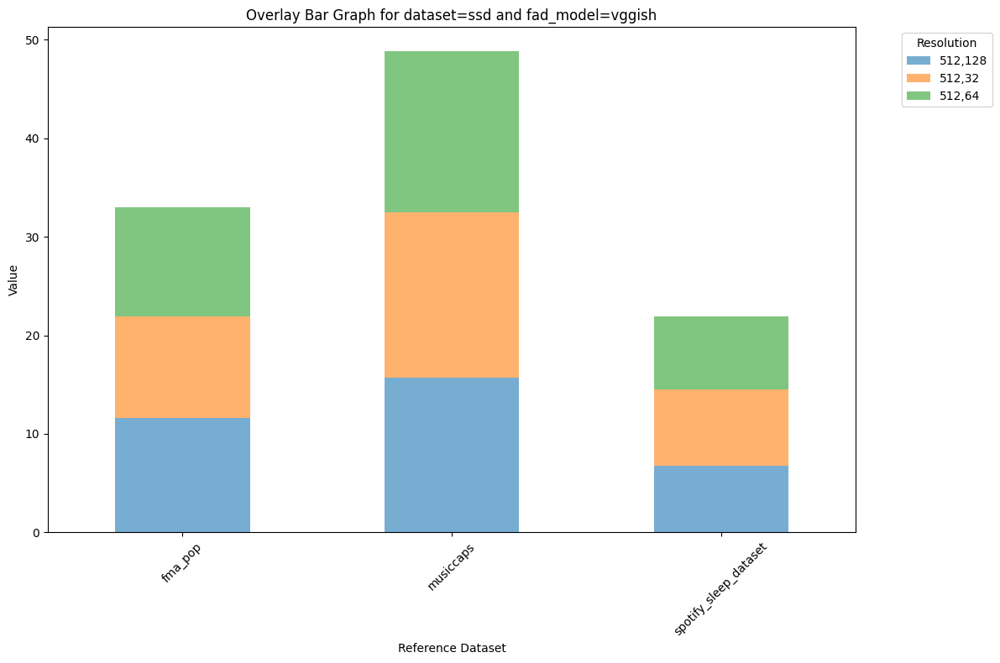

In [118]:
plot_bar_graph(result_df, 'ssd', 'vggish')

In [14]:
result_df.to_csv('../results/long_ssd_results.csv')

# Inference/Training Time vs FAD score

In [ ]:
# we want real time inference being taken into account

# Selected Non-Noisy Samples

In [38]:
log_dirs = [
    "../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddim_nisteps_100",
    "../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddim_nisteps_100_selected",
    "../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000",
    "../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000_selected",
    
    "../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100",
    "../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100_selected",
    "../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000",
    "../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_selected"
]

In [39]:
# Extract scalars from all directories and combine into a single DataFrame
all_scalars = []

for log_dir in log_dirs:
    print(log_dir)
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

# Combine all dataframes
result_df = pd.concat(all_scalars, ignore_index=True)

# Save the DataFrame to a CSV file
result_df.to_csv('selected_scalars.csv', index=False)


../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddim_nisteps_100_selected
../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000_selected
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddim_nisteps_100_selected
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_selected


In [40]:
result_df

,wall_time,step,value,log_dir,tag
0,1.716554e+09,0,0.657153,../hpc_tensorboard/models/ssd_512_128/model_st...,fad_clap-laion-audio_ref_spotify_sleep_dataset...
1,1.716554e+09,0,0.608632,../hpc_tensorboard/models/ssd_512_128/model_st...,fad_clap-laion-music_ref_spotify_sleep_dataset...
2,1.716554e+09,0,6.279850,../hpc_tensorboard/models/ssd_512_128/model_st...,fad_vggish_ref_spotify_sleep_dataset_gen_None
3,1.716554e+09,0,0.774109,../hpc_tensorboard/models/ssd_512_128/model_st...,fad_clap-laion-audio_ref_fma_pop_gen_None
4,1.716554e+09,0,0.823027,../hpc_tensorboard/models/ssd_512_128/model_st...,fad_clap-laion-music_ref_fma_pop_gen_None
...,...,...,...,...,...
85,1.717079e+09,0,0.859856,../hpc_tensorboard/models/ssd_256_256/model_st...,fad_clap-laion-music_ref_fma_pop_gen_None
86,1.717079e+09,0,11.014889,../hpc_tensorboard/models/ssd_256_256/model_st...,fad_vggish_ref_fma_pop_gen_None
87,1.717080e+09,0,0.670229,../hpc_tensorboard/models/ssd_256_256/model_st...,fad_clap-laion-audio_ref_musiccaps_gen_None
88,1.717080e+09,0,0.865207,../hpc_tensorboard/models/ssd_256_256/model_st...,fad_clap-laion-music_ref_musiccaps_gen_None


In [23]:
result_df['log_dir'][29]

'../hpc_tensorboard/models/ssd_512_128/model_step_40000/samples/sch_ddpm_nisteps_1000_selected'

In [41]:
# Function to extract dataset
def extract_dataset(log_dir):
    return log_dir.split('/')[3].split('_')[0]

# Function to extract resolution
def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[3].split('_')[1:])

# Function to extract model_step
def extract_model_step(log_dir):
    return log_dir.split('/')[4].split('_')[2]

# Function to extract sampler
def extract_sampler(log_dir):
    return log_dir.split('/')[-1].split('_')[1]

# extract selected
def extract_selected(log_dir):
    return 'selected' in log_dir.split('/')[-1]

# Apply the functions to create new columns
result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)
result_df['selected'] = result_df['log_dir'].apply(extract_selected)

# Function to extract fad_model
def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

# Function to extract reference_dataset
def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

# Apply the functions to create new columns
result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

# Drop the original 'log_dir' and 'tag' columns if no longer needed
result_df.drop(columns=['log_dir', 'tag'], inplace=True)

# import ace_tools as tools; tools.display_dataframe_to_user(name="Cleaned Results DataFrame", dataframe=result_df)

In [45]:
result_df = result_df[result_df['fad_model'].isin(['clap-laion-audio', 'clap-laion-music', 'vggish'])]

In [50]:
result_df.to_csv('../results/selected_noise_level_results.csv')

In [53]:
result_df[result_df['resolution'] == '256,256']

,wall_time,step,value,dataset,resolution,model_step,sampler,selected,fad_model,reference_dataset
36,1.716266e+09,0,0.624939,ssd,"256,256",40000,ddim,False,clap-laion-audio,spotify_sleep_dataset
37,1.716266e+09,0,0.611860,ssd,"256,256",40000,ddim,False,clap-laion-music,spotify_sleep_dataset
38,1.716266e+09,0,5.787899,ssd,"256,256",40000,ddim,False,vggish,spotify_sleep_dataset
42,1.716266e+09,0,0.764739,ssd,"256,256",40000,ddim,False,clap-laion-audio,fma_pop
43,1.716266e+09,0,0.848486,ssd,"256,256",40000,ddim,False,clap-laion-music,fma_pop
44,1.716266e+09,0,11.159650,ssd,"256,256",40000,ddim,False,vggish,fma_pop
48,1.716267e+09,0,0.735829,ssd,"256,256",40000,ddim,False,clap-laion-audio,musiccaps
49,1.716267e+09,0,0.848345,ssd,"256,256",40000,ddim,False,clap-laion-music,musiccaps
50,1.716267e+09,0,15.183124,ssd,"256,256",40000,ddim,False,vggish,musiccaps
54,1.717079e+09,0,0.575088,ssd,"256,256",40000,ddim,True,clap-laion-audio,spotify_sleep_dataset


# Load FAD Compute Experiments


In [1]:
# Suffixes for directories containing 'sch_ddpm_nisteps_1000'
sch_ddpm_nisteps_1000_suffixes = [
    '',
    '102',
    '204',
    '409',
    '1024',
    '51',
    '1228',
    '1433',
    '614',
    '819',
    '1638',
    '1843'
]

# Suffixes for directories containing 'sch_ddim_nisteps_100'
sch_ddim_nisteps_100_suffixes = [
    '',
    '102',
    '204',
    '409',
    '51',
    '1024',
    '1228',
    '1433',
    '1638',
    '1843',
    '614',
    '819'
]

# Suffixes for directories containing 'sch_ddpm_nisteps_1000'
sch_ddpm_nisteps_1000_suffixes2 = [
    '',
    '40',
    '80',
    '160',
    '320',
    '480',
    '640',
    '800',
    '960',
    '1120',
    '1280',
    '1440'
]

# Suffixes for directories containing 'sch_ddim_nisteps_100'
sch_ddim_nisteps_100_suffixes2 = [
    '',
    '51',
    '102',
    '204',
    '409',
    '614',
    '819',
    '1024',
    '1228',
    '1433',
    '1638',
    '1843'
]



In [2]:
suffixes = set(
    sch_ddpm_nisteps_1000_suffixes +
    sch_ddim_nisteps_100_suffixes +
    sch_ddpm_nisteps_1000_suffixes2 +
    sch_ddim_nisteps_100_suffixes2
)

# Convert the set back to a list (optional, if you need a list)
unique_suffixes = list(suffixes)

In [3]:
import os

log_dirs = []
for base_model in ['ssd_256_256', 'ssd_64_64']:
    for model_step in [40000]:
        for inf_path in ['sch_ddpm_nisteps_1000', 'sch_ddim_nisteps_100']:
            for suffix in unique_suffixes:
                # if suffix == '':
                #     suffix = 1600 if base_model == 'ssd_256' and inf_path == 'sch_ddpm_nisteps_1000' else 2048
                ending = f"{inf_path}_{suffix}" if suffix else inf_path

                path = f'../hpc_tensorboard/models/{base_model}/model_step_{model_step}/samples/{ending}'
                
                if os.path.exists(path):
                    log_dirs.append(path)


In [4]:
log_dirs

['../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_1440',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_160',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_80',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_1280',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_480',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_40',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_1120',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_800',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000_320',
 '../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm

In [14]:
# Extract scalars from all directories and combine into a single DataFrame
all_scalars = []

for log_dir in log_dirs:
    scalars = extract_scalars(log_dir)
    for tag, values in scalars.items():
        df = pd.DataFrame(values)
        df['log_dir'] = log_dir
        df['tag'] = tag
        all_scalars.append(df)

# Combine all dataframes
result_df = pd.concat(all_scalars, ignore_index=True)

# Save the DataFrame to a CSV file
result_df.to_csv('fad_compute_scalars.csv', index=False)

2024-06-01 13:38:24.469821: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-01 13:38:28.727602: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [15]:
# Function to extract dataset
def extract_dataset(log_dir):
    if 'vae' not in log_dir:
        return log_dir.split('/')[3].split('_')[0]
    else:
        return log_dir.split('/')[3].split('_')[1]

# Function to extract resolution
def extract_resolution(log_dir):
    return ','.join(log_dir.split('/')[3].split('_')[2:])

# Function to extract model_step
def extract_model_step(log_dir):
    return log_dir.split('/')[4].split('_')[2]

# Function to extract sampler
def extract_sampler(log_dir):
    return log_dir.split('/')[-1].split('_')[1]

# Function to extract num samples
def extract_num_samples(log_dir):
    print(f'-------------')
    print(log_dir)
    print(log_dir.split('/')[-1].split('_'))
    print(log_dir.split('/')[-1].split('_')[-1])
    if len(log_dir.split('/')[-1].split('_')) == 4:
        if '256_256' in log_dir and 'sch_ddpm' in log_dir:
            return 1600
        else:
            return 2048
    else:
        return log_dir.split('/')[-1].split('_')[-1]
        

# Function to extract sampler
def extract_vae(log_dir):
    if 'vae' in log_dir:
        return log_dir.split('/')[3].split('_')[0]
    else:
        return None


# Apply the functions to create new columns
result_df['dataset'] = result_df['log_dir'].apply(extract_dataset)
result_df['resolution'] = result_df['log_dir'].apply(extract_resolution)
result_df['model_step'] = result_df['log_dir'].apply(extract_model_step)
result_df['sampler'] = result_df['log_dir'].apply(extract_sampler)
result_df['vae'] = result_df['log_dir'].apply(extract_vae)
result_df['num_fad_samples'] = result_df['log_dir'].apply(extract_num_samples)

# Function to extract fad_model
def extract_fad_model(tag):
    return tag.split('fad_')[1].split('_ref')[0]

# Function to extract reference_dataset
def extract_reference_dataset(tag):
    return tag.split('_ref_')[1].split('_gen')[0]

# Apply the functions to create new columns
result_df['fad_model'] = result_df['tag'].apply(extract_fad_model)
result_df['reference_dataset'] = result_df['tag'].apply(extract_reference_dataset)

# Drop the original 'log_dir' and 'tag' columns if no longer needed
result_df.drop(columns=['log_dir', 'tag'], inplace=True)

# import ace_tools as tools; tools.display_dataframe_to_user(name="Cleaned Results DataFrame", dataframe=result_df)


-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensorboard/models/ssd_256_256/model_step_40000/samples/sch_ddpm_nisteps_1000
['sch', 'ddpm', 'nisteps', '1000']
1000
-------------
../hpc_tensor

In [16]:
result_df

,wall_time,step,value,dataset,resolution,model_step,sampler,vae,num_fad_samples,fad_model,reference_dataset
0,1.716266e+09,0,0.589961,ssd,256,40000,ddpm,None,1600,clap-laion-audio,spotify_sleep_dataset
1,1.716266e+09,0,0.594222,ssd,256,40000,ddpm,None,1600,clap-laion-music,spotify_sleep_dataset
2,1.716266e+09,0,6.104685,ssd,256,40000,ddpm,None,1600,vggish,spotify_sleep_dataset
3,1.716266e+09,0,23.567801,ssd,256,40000,ddpm,None,1600,encodec-emb-48k,spotify_sleep_dataset
4,1.716266e+09,0,130.400467,ssd,256,40000,ddpm,None,1600,encodec-emb,spotify_sleep_dataset
...,...,...,...,...,...,...,...,...,...,...,...
391,1.716686e+09,0,0.898424,ssd,64,40000,ddim,None,1638,clap-laion-music,spotify_sleep_dataset
392,1.716686e+09,0,1.029789,ssd,64,40000,ddim,None,1638,clap-laion-audio,fma_pop
393,1.716686e+09,0,1.047556,ssd,64,40000,ddim,None,1638,clap-laion-music,fma_pop
394,1.716686e+09,0,1.006626,ssd,64,40000,ddim,None,1638,clap-laion-audio,musiccaps


In [17]:
result_df['num_fad_samples'] = result_df['num_fad_samples'].astype(int)

In [18]:
result_df.to_csv('../results/fad_samples_results.csv')

In [9]:
result_df = pd.read_csv('../results/fad_samples_results.csv')

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_fad_samples(df, reference_dataset, fad_model, sampler='ddpm'):
    # Filter dataframe by reference_dataset, fad_model, and sampler
    filtered_df = df[(df['reference_dataset'] == reference_dataset) &
                     (df['fad_model'] == fad_model) &
                     (df['sampler'] == sampler)]
    
    # Check if the dataframe is empty after filtering
    if filtered_df.empty:
        print(f"No data found for reference_dataset={reference_dataset}, fad_model={fad_model}, and sampler={sampler}.")
        return
    
    # Plotting
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Use seaborn to plot, with 'resolution' as hue for color distinction
    sns.lineplot(data=filtered_df, x='num_fad_samples', y='value', hue='resolution', marker='o')

    # Customize plot
    plt.title(f'FAD Samples for {fad_model} on {reference_dataset}', fontsize=14)
    plt.xlabel('Number of FAD Samples', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.legend(title='Resolution')
    plt.tight_layout()

    # Show plot
    plt.show()


In [ ]:
plot_fad_samples(result_df, 'ssd', 'clap-laion-

No data found for reference_dataset=ssd, fad_model=fma_pop, and sampler=clap-laion-audio.


/tmp/ipykernel_1044190/4137048193.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab10', len(resolutions))


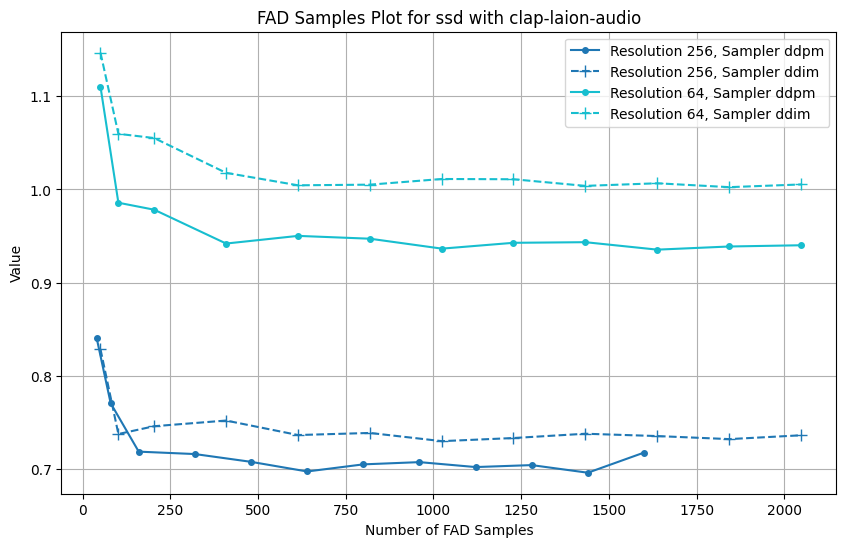

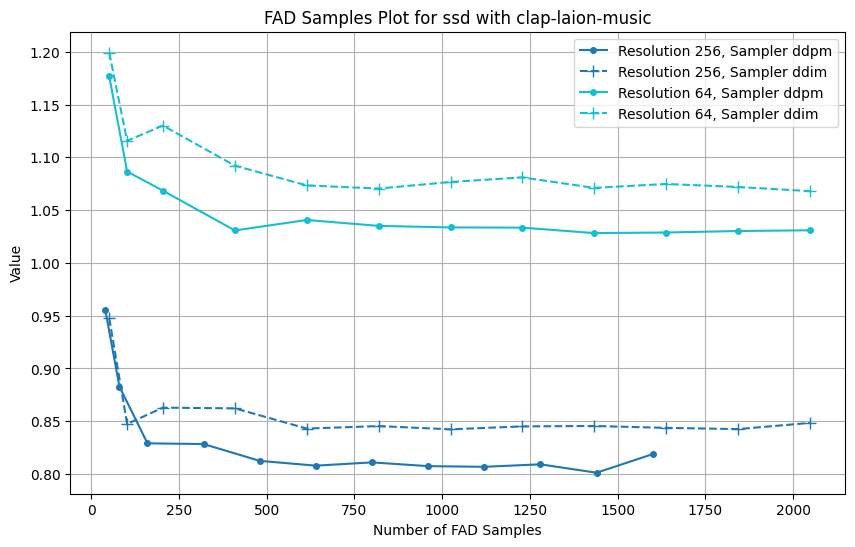

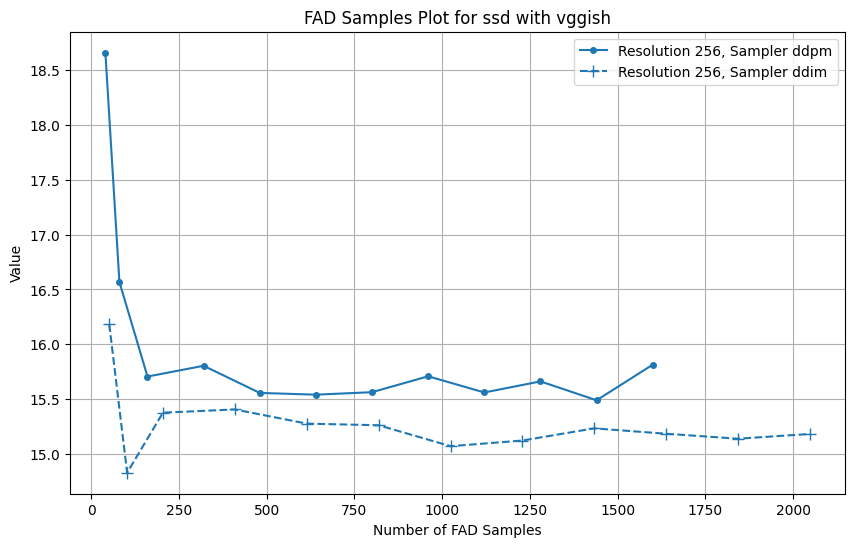

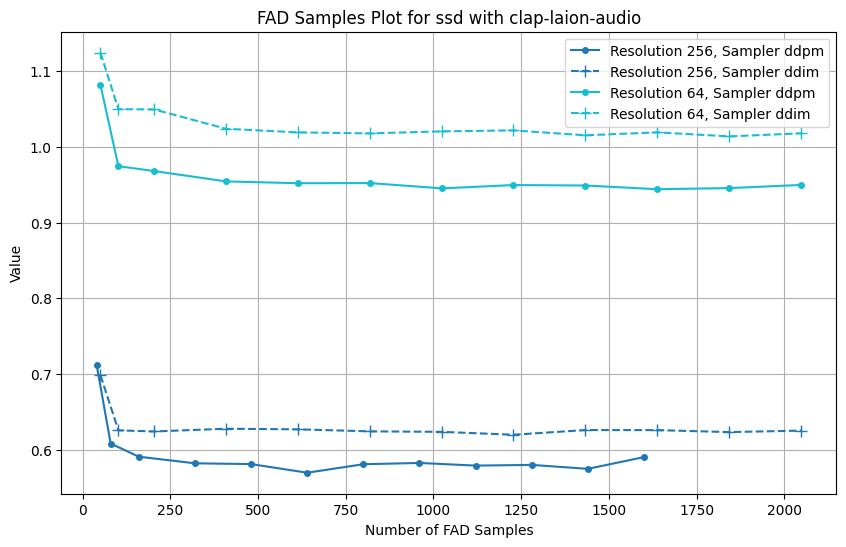

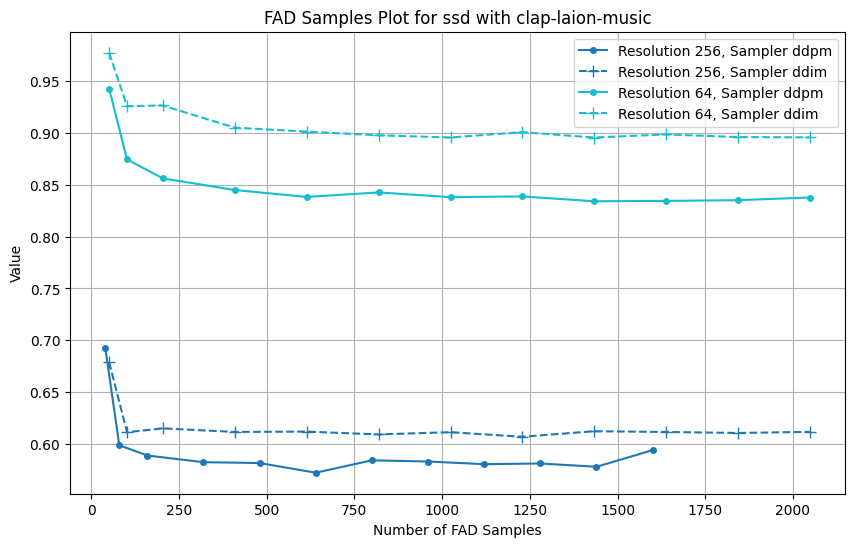

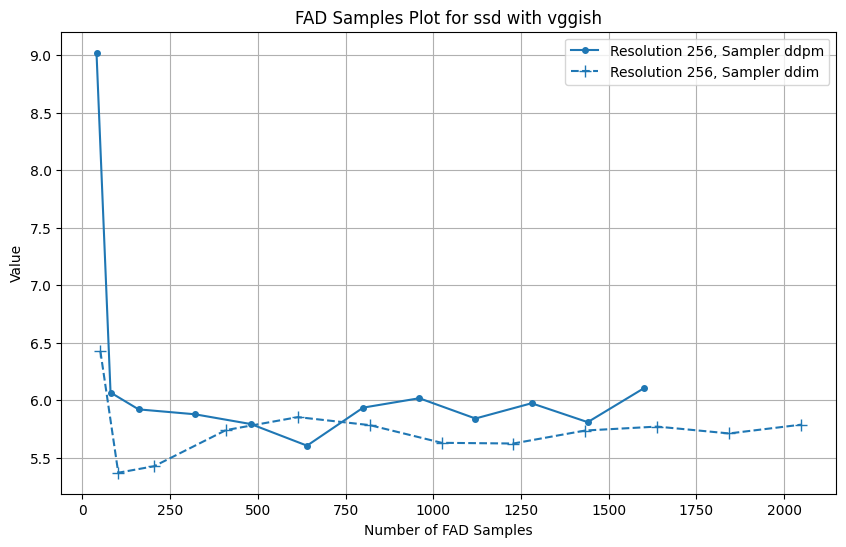

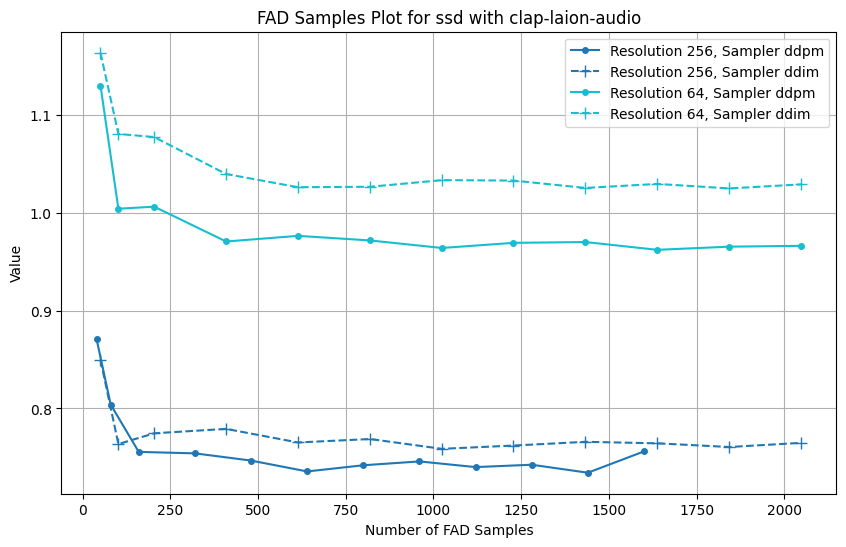

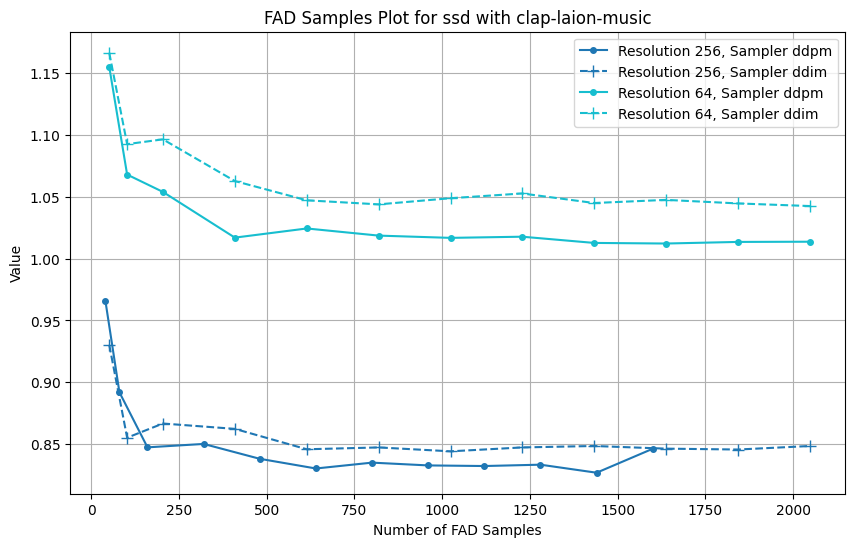

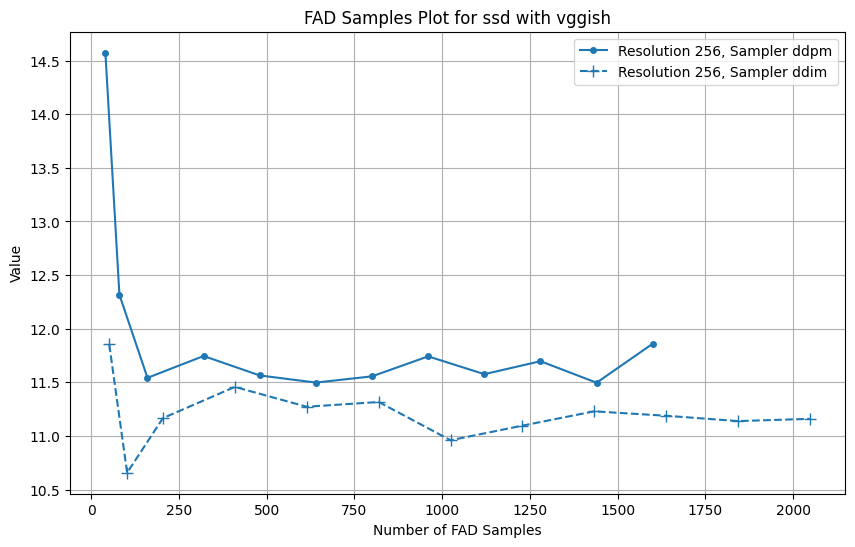

In [88]:
for ref_dataset in ['musiccaps', 'spotify_sleep_dataset', 'fma_pop']:
    for model in ['clap-laion-audio', 'clap-laion-music', 'vggish']:
        plot_fad_samples(result_df, 'ssd', ref_dataset, model)

/tmp/ipykernel_1044190/3019857737.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab10', len(resolutions))


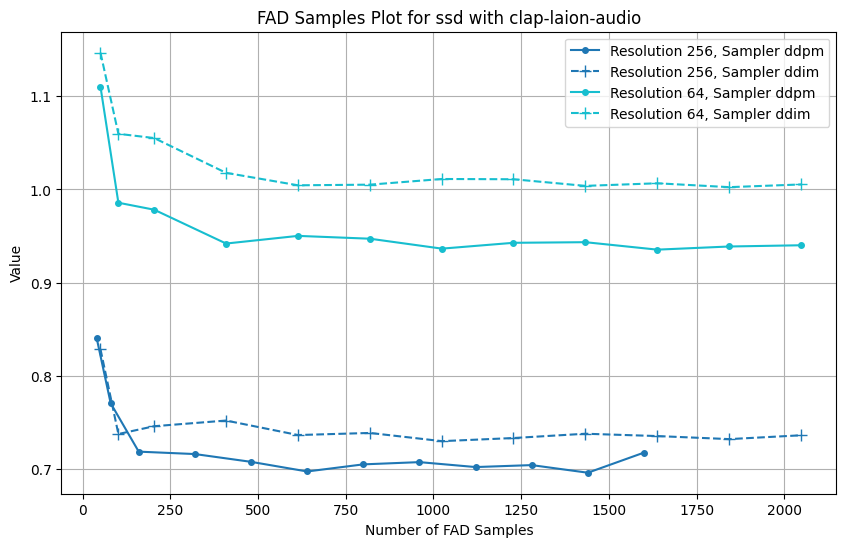

In [83]:
plot_fad_samples(result_df, 'ssd', 'musiccaps', 'clap-laion-audio')

/tmp/ipykernel_1044190/3019857737.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab10', len(resolutions))


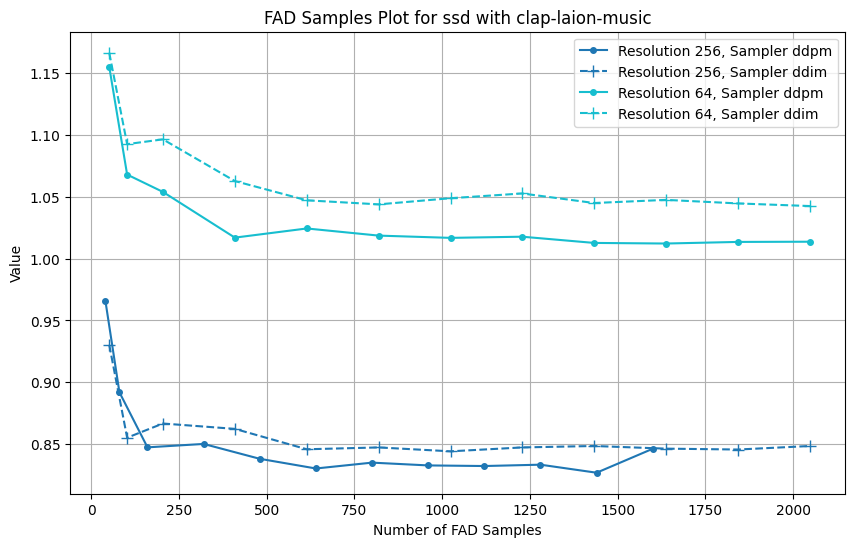

In [82]:
plot_fad_samples(result_df, 'ssd', 'fma_pop', 'clap-laion-music')

In [5]:
import pickle
import torch

# Load the .pkl file
file_path = '../cache/spotify_sleep_dataset/encodings.pkl'

with open(file_path, 'rb') as file:
    data = pickle.load(file)

# Assuming the data is a dictionary of tensors
for d in data:
    print(d.shape)
    break


(1, 512)


In [6]:
# Install necessary libraries
!pip install transformers

import torch
from transformers import T5EncoderModel, T5Tokenizer
import os

# Load the T5 encoder model
model_name = "t5-small"
model = T5EncoderModel.from_pretrained(model_name)
tokenizer = T5Tokenizer.from_pretrained(model_name)

# Calculate the number of parameters
num_params = sum(p.numel() for p in model.parameters())
print(f"Number of parameters: {num_params}")

# Save the model to a temporary file to calculate its size
model.save_pretrained("./temp_model")
model_size = sum(os.path.getsize(os.path.join("./temp_model", f)) for f in os.listdir("./temp_model"))
model_size_mb = model_size / (1024 * 1024)
print(f"Model size: {model_size_mb:.2f} MB")

# Cleanup the temporary model files
import shutil
shutil.rmtree("./temp_model")


DEPRECATION: pytorch-lightning 1.7.7 has a non-standard dependency specifier torch>=1.9.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


/home/th716/.conda/envs/audiodiff_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Number of parameters: 35330816
Model size: 134.78 MB


# Plot losses

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_loss_curve(df):
    # Ensure the dataframe has the necessary columns
    if not all(col in df.columns for col in ['Wall time', 'Step', 'Value']):
        raise ValueError("DataFrame must contain 'Wall Time', 'Step', and 'Value' columns")

    # Plot the original loss curve in light blue
    plt.figure(figsize=(12, 6))
    plt.plot(df['Step'], df['Value'], color='lightblue', label='Original Loss Curve')

    # Calculate the smoothed version using a simple moving average
    window_size = 10  # This can be adjusted based on the desired smoothness
    df['Smoothed Value'] = df['Value'].rolling(window=window_size).mean()

    # Plot the smoothed loss curve in normal blue
    plt.plot(df['Step'], df['Smoothed Value'], color='blue', label='Smoothed Loss Curve')

    # Adding titles and labels
    plt.title('Training Loss Curve')
    plt.xlabel('Step')
    plt.ylabel('Loss Value')
    plt.legend()
    plt.grid(True)

    # Calculate the 98th percentile value for the y-axis limit
    y_max = df['Value'].quantile(0.98)
    plt.ylim(bottom=0, top=y_max)

    # Show the plot
    plt.show()

# Example usage:
# Assuming you have a DataFrame df with the appropriate columns
# plot_loss_curve(df)


In [30]:
df = pd.read_csv('../results/models_ssd_256_256_logs_train_unet.csv')

In [31]:
df

,Wall time,Step,Value
0,1.715830e+09,19,0.851802
1,1.715830e+09,63,0.073511
2,1.715830e+09,108,0.054973
3,1.715831e+09,173,0.046182
4,1.715831e+09,245,0.048564
...,...,...,...
995,1.715877e+09,39916,0.024810
996,1.715877e+09,39940,0.017617
997,1.715877e+09,39986,0.017467
998,1.715877e+09,39994,0.021818


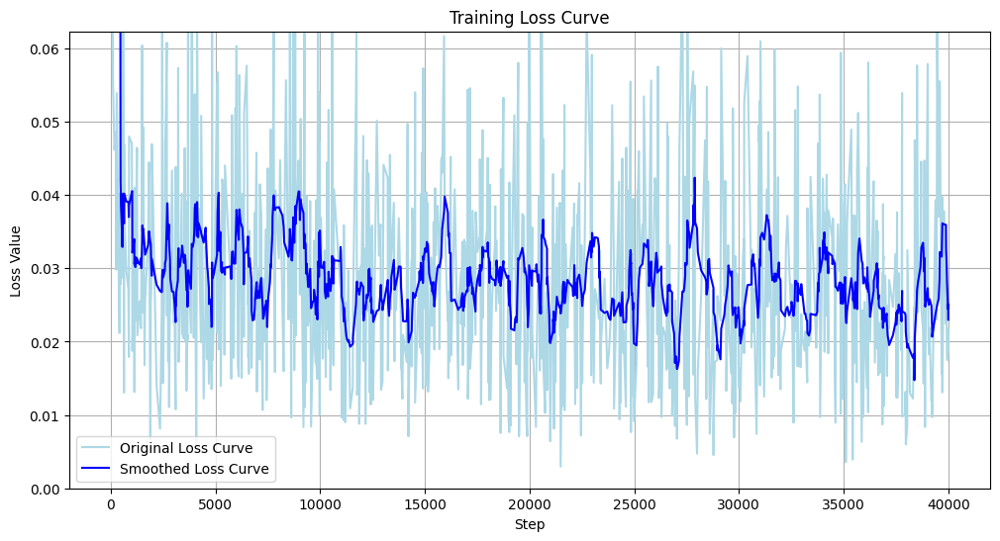

In [32]:
plot_loss_curve(df)

# Calculating Spread of Each Distribution

In [7]:
import numpy as np
import pandas as pd

# Define the list of datasets and models
datasets = [
    ('spotify_sleep_dataset', 'waveform'),
    ('fma_pop', 'waveform'),
    ('drum_samples', 'waveform'),
    ('musiccaps', 'waveform')
]

models = ['vggish', 'clap-laion-audio', 'clap-laion-music']

# Initialize an empty list to store the results
results = []

for dataset, feature_type in datasets:
    for model in models:
        mean_file = f'../stats_from_hpc/{dataset}/{feature_type}/stats/{model}/mu.npy'
        cov_file = f'../stats_from_hpc/{dataset}/{feature_type}/stats/{model}/cov.npy'
        
        try:
            mean_vector = np.load(mean_file)
            cov_matrix = np.load(cov_file)
            
            # Calculate the overall spread characteristics
            eigenvalues = np.linalg.eigvals(cov_matrix)
            volume = np.sqrt(np.linalg.det(cov_matrix))
            trace = np.trace(cov_matrix)
            
            # Store the results in the list
            results.append({
                'dataset': dataset,
                # 'feature_type': feature_type,
                'model': model,
                # 'eigenvalues': eigenvalues,
                # 'volume': volume,
                'trace': trace
            })
        
        except Exception as e:
            print(f"Error processing {dataset}, {feature_type}, {model}: {e}")

# Convert the results into a DataFrame
df = pd.DataFrame(results)


In [8]:
df

,dataset,model,trace
0,spotify_sleep_dataset,vggish,9.358106
1,spotify_sleep_dataset,clap-laion-audio,0.573894
2,spotify_sleep_dataset,clap-laion-music,0.501345
3,fma_pop,vggish,12.961600
4,fma_pop,clap-laion-audio,0.734825
5,fma_pop,clap-laion-music,0.789479
6,drum_samples,vggish,5.084578
7,drum_samples,clap-laion-audio,0.457986
8,drum_samples,clap-laion-music,0.462441
9,musiccaps,vggish,19.674353


In [7]:
import os
from pydub import AudioSegment

def calculate_total_audio_length(directory):
    total_length_ms = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(('.wav', '.mp3')):
                print(file)
                file_path = os.path.join(root, file)
                audio = AudioSegment.from_file(file_path)
                total_length_ms += len(audio)

    total_length_hours = total_length_ms / (1000 * 60 * 60)
    return total_length_hours

# Example usage:
directory = "../cache/drum_samples/waveform/"
total_length_hours = calculate_total_audio_length(directory)
print(f"Total length of audio files: {total_length_hours:.2f} hours")


sample_698.wav
sample_51.wav
sample_80.wav
sample_228.wav
sample_4.wav


/home/th716/.conda/envs/audiodiff_env/lib/python3.11/site-packages/pydub/utils.py:198: RuntimeWarning: Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work
  warn("Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work", RuntimeWarning)


FileNotFoundError: [Errno 2] No such file or directory: 'ffprobe'

In [5]:
!pip install pydub


DEPRECATION: pytorch-lightning 1.7.7 has a non-standard dependency specifier torch>=1.9.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


# Filter Noisy Samples for Strong Ones

In [26]:
import os
import numpy as np
import librosa
import librosa.display
from tqdm.notebook import tqdm
import pandas as pd

def is_noisy(file_path, noise_threshold):
    y, sr = librosa.load(file_path)
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_dB = librosa.power_to_db(S, ref=np.max)
    
    # Calculate the noise level
    noise_level = np.mean(S_dB)
    
    # Determine if the file is noisy based on the noise threshold
    is_noisy = noise_level > noise_threshold
    
    return is_noisy, noise_level

def filter_noisy_files(directory, noise_threshold):
    """
    Filters out noisy .wav files in a given directory and records noise levels.

    Parameters:
    directory (str): The path to the directory containing .wav files.
    noise_threshold (float): The noise threshold. Files with a mean mel spectrogram density above this value are considered noisy.

    Returns:
    DataFrame: A DataFrame with file paths and their noise levels.
    """
    data = []

    for filename in tqdm(os.listdir(directory)):
        if filename.endswith(".wav"):
            file_path = os.path.join(directory, filename)
            is_noisy_file, noise_level = is_noisy(file_path, noise_threshold)
            data.append({'file_path': file_path, 'noise_level': noise_level, 'is_noisy': is_noisy_file})

    df = pd.DataFrame(data)
    return df


In [28]:
import os
import numpy as np
import librosa
import librosa.display
from tqdm import tqdm
import pandas as pd

def calculate_noise_level(file_path):
    y, sr = librosa.load(file_path)
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_dB = librosa.power_to_db(S, ref=np.max)
    
    # Calculate the noise level
    noise_level = np.mean(S_dB)
    
    return noise_level

def process_files(directory):
    """
    Processes .wav files in a given directory and records their noise levels.

    Parameters:
    directory (str): The path to the directory containing .wav files.

    Returns:
    DataFrame: A DataFrame with file paths and their noise levels.
    """
    data = []

    for filename in tqdm(os.listdir(directory)):
        if filename.endswith(".wav"):
            file_path = os.path.join(directory, filename)
            noise_level = calculate_noise_level(file_path)
            data.append({'file_path': file_path, 'noise_level': noise_level})

    df = pd.DataFrame(data)
    return df

In [29]:
# Define directories to process
directories = [
    '../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000',
    '../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100'
]

all_data = []

# Process each directory and collect results
for directory in directories:
    df = process_files(directory)
    all_data.append(df)

# Concatenate all data into a single DataFrame
final_df = pd.concat(all_data, ignore_index=True)

# Display the DataFrame
final_df

  0%|          | 0/1603 [00:00<?, ?it/s]

100%|██████████| 2051/2051 [00:38<00:00, 52.74it/s]


,file_path,noise_level
0,../models/ssd_256_256/model_step_40000/samples...,-31.145237
1,../models/ssd_256_256/model_step_40000/samples...,-49.920723
2,../models/ssd_256_256/model_step_40000/samples...,-23.878395
3,../models/ssd_256_256/model_step_40000/samples...,-54.079487
4,../models/ssd_256_256/model_step_40000/samples...,-41.731911
...,...,...
3643,../models/ssd_256_256/model_step_40000/samples...,-53.294174
3644,../models/ssd_256_256/model_step_40000/samples...,-28.178940
3645,../models/ssd_256_256/model_step_40000/samples...,-48.791592
3646,../models/ssd_256_256/model_step_40000/samples...,-47.303078


In [30]:
final_df['file_path'][0]

'../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_219.wav'

In [31]:
final_df.to_csv('../results/ssd_256_256_noise_levels.csv')

In [54]:
df = pd.read_csv('../results/ssd_256_256_noise_levels.csv')

In [59]:
pd.set_option('max_colwidth', None)

In [87]:
df.shape

(3648, 3)

In [129]:
strings_to_check = [
    'sch_ddim_nisteps_100/audio_1029.wav',
    'sch_ddpm_nisteps_1000/audio_960.wav',
    'sch_ddpm_nisteps_1000/audio_889.wav',
    'sch_ddim_nisteps_100/audio_1446.wav',
    'sch_ddpm_nisteps_1000/audio_0572.wav',
    'sch_ddpm_nisteps_1000/audio_3.wav',
    'sch_ddpm_nisteps_1000/audio_576.wav'
]

import re

# Escape dots and add word boundaries to the strings
escaped_strings = [re.escape(s) for s in strings_to_check]
pattern = r'\b(?:' + '|'.join(escaped_strings) + r')\b'

In [130]:
df[df['file_path'].str.contains(pattern, regex=True)]

,Unnamed: 0,file_path,noise_level
591,591,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_960.wav,-61.740643
666,666,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_576.wav,-11.347769
851,851,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_889.wav,-52.534264
891,891,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_0572.wav,-34.657722
1378,1378,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_3.wav,-21.168194
3188,3188,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100/audio_1029.wav,-72.180720
3221,3221,../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100/audio_1446.wav,-45.328970


In [35]:
import os
import shutil
import pandas as pd

# New directories
new_dir_ddpm = '../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000_selected/'
new_dir_ddim = '../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100_selected/'

# Create new directories if they do not exist
os.makedirs(new_dir_ddpm, exist_ok=True)
os.makedirs(new_dir_ddim, exist_ok=True)

# Filter DataFrame based on noise_level
filtered_df = df[df['noise_level'] < -40]

# Copy files to the new directories
for index, row in filtered_df.iterrows():
    source_path = row['file_path']
    if 'ddpm' in row['file_path']:
        dest_path = os.path.join(new_dir_ddpm, os.path.basename(source_path))
    else:
        dest_path = os.path.join(new_dir_ddim, os.path.basename(source_path))
    
    # Copy the file
    shutil.copy2(source_path, dest_path)

print("Files copied successfully.")


Files copied successfully.


### Generating pretty mel specs

In [111]:
def generate_mel_spectrogram(audio_path, output_path='mel_spectrogram'):
    # Load the audio file
    y, sr = librosa.load(audio_path)

    # Generate the Mel spectrogram
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=256, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)

    # Create the plot
    fig, ax = plt.subplots(figsize=(6,6))
    ax.axis('off')

    # Define the custom color map
    cmap = plt.get_cmap('magma')

    # Display the Mel spectrogram
    ax.imshow(S_dB, aspect='auto', origin='lower', cmap=cmap)

    # Save the plot to a file without white borders
    fig.savefig(f"../results/mel_specs/{output_path}.png", bbox_inches='tight', pad_inches=0, dpi=300)
    plt.close(fig)

In [112]:
# Replace 'your_audio_file.wav' with the path to your audio file
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100/audio_1029.wav', output_path = 'audio_1029.png')

In [113]:
# Replace 'your_audio_file.wav' with the path to your audio file
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_960.wav', output_path = 'audio_960.png')

In [114]:
# Replace 'your_audio_file.wav' with the path to your audio file
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_889.wav', output_path = 'audio_889.png')

In [115]:
# Replace 'your_audio_file.wav' with the path to your audio file
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddim_nisteps_100/audio_1446.wav', output_path = 'audio_1446.png')

In [116]:
# Replace 'your_audio_file.wav' with the path to your audio file
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_0572.wav', output_path = 'audio_0572.png')

In [117]:
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_3.wav', output_path = 'audio_3.png')


In [118]:
generate_mel_spectrogram('../models/ssd_256_256/model_step_40000/samples/audio/sch_ddpm_nisteps_1000/audio_576.wav', output_path = 'audio_576.png')
